In [1]:
import pandas as pd
import pyspark

In [2]:
import matplotlib.pyplot as plt
import matplotlib
plt.style.use('default')
plt.rcParams["figure.figsize"] = (20,15)
matplotlib.rcParams['axes.labelsize'] = 14
matplotlib.rcParams['xtick.labelsize'] = 12
matplotlib.rcParams['ytick.labelsize'] = 12
matplotlib.rcParams['text.color'] = 'k'

In [3]:
joined_data=pd.read_csv('./data.csv')

In [4]:
submission=pd.read_csv('./sample_submission.csv')

# Features 

In [5]:
import calendar
joined_data['date']=pd.to_datetime(joined_data['date'])
joined_data['week'] = joined_data['date'].dt.isocalendar().week.astype('category')
joined_data['quarter'] = joined_data['date'].dt.quarter.astype('category')
joined_data['day_of_week'] = joined_data['date'].dt.day_name().astype('category')
joined_data['isweekend'] = joined_data.day_of_week.apply(lambda x: 1 if x in (5,6) else 0)
joined_data['startschool'] = joined_data['date'].dt.month.apply(lambda x: 1 if x in (4,5,8,9) else 0)
joined_data.loc[joined_data['isevent']=='y','isevent']=1
joined_data.loc[joined_data['isevent']=='n','isevent']=0
joined_data['isevent']=joined_data['isevent'].astype('int')
joined_data['sales']=joined_data['sales'].astype('float')
joined_data['onpromotion']=joined_data['onpromotion'].astype('int')

In [6]:
import numpy as np
joined_data['sales']=joined_data['sales'].astype('float')
joined_data['log_sales']=np.log1p(joined_data['sales'])

In [7]:
data=joined_data[['date', 'store_nbr', 'family', 'onpromotion','dcoilwtico', 'uniquestore', 'newstore', 'firstday',
       'event_type', 'isevent', 'isclosed', 'week','isweekend','startschool', 'sales','log_sales']]

In [8]:
data['dcoilwtico']=data['dcoilwtico'].fillna(data['dcoilwtico'].min())

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\1669128981.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['dcoilwtico']=data['dcoilwtico'].fillna(data['dcoilwtico'].min())


In [9]:
train=data[data['date']<'2017-08-15']

In [10]:
test=data[data['date']>'2017-08-15']

In [11]:
cat_feat=['store_nbr','uniquestore','event_type', 'isevent', 'isclosed','week','newstore','firstday','isweekend','startschool']

In [12]:
for c in cat_feat:
    data[c] = data[c].astype('category')
    train[c] = train[c].astype('category')
    test[c] = test[c].astype('category')

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\1031430290.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[c] = data[c].astype('category')
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\1031430290.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train[c] = train[c].astype('category')
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\1031430290.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,

In [13]:
data_dummies = pd.get_dummies(data,columns=cat_feat,drop_first=True)

# Linear Regression with Pooling by Family: 1.00845

In [14]:
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error
val_lr_df={}
lr_df={}
test_lr_dict={}
lr_rmse_dict={}
for i in  data_dummies.family.unique():
    X=data_dummies[ (data_dummies['family']==i)].drop(['date','sales','log_sales','family'],axis=1)
    y=data_dummies[(data_dummies['date']<='2016-05-01') & (data_dummies['family']==i)].drop(['date'],axis=1)['log_sales']
    lr_df[i]=data[data['family']==i]
    X_train=data_dummies[(data_dummies['date']<='2016-05-01') & (data_dummies['family']==i)].drop(['date','sales','log_sales','family'],axis=1)
    y_train=data_dummies[(data_dummies['date']<='2016-05-01') & (data_dummies['family']==i)].drop(['date'],axis=1)['log_sales']
    X_val=data_dummies[(data_dummies['date']>'2016-05-01') & (data_dummies['date']<='2017-08-15') & (data_dummies['family']==i)].drop(['date','sales','log_sales','family'],axis=1)
    y_val=data_dummies[(data_dummies['date']>'2016-05-01') & (data_dummies['date']<='2017-08-15') & (data_dummies['family']==i)].drop(['date'],axis=1)['log_sales']
    test_family_dummies=data_dummies[(data_dummies['date']>'2017-08-15')  & (data_dummies['family']==i)]
    X_test=test_family_dummies.drop(['date','sales','log_sales','family'],axis=1)
    test_family=data[(data['date']>'2017-08-15')  & (data['family']==i)]
    test_lr_dict[i]=test_family
    lr=Ridge().fit(X_train,y_train)
    y_pred = lr.predict(X_val)
    y_test = lr.predict(X_test)
    y_all=lr.predict(X)
    
    rmse=np.sqrt(mean_squared_error(np.expm1(y_val),np.expm1(y_pred)))
    print('family: ',i,' ,rmse: ',rmse)
    lr_rmse_dict[i]=rmse
    
    
    val_lr_df[i]=data[(data['date']>'2016-05-01') & (data['date']<='2017-08-15') & (data['family']==i)]
    val_lr_df[i]['pred'] = np.expm1(y_pred)
    lr_df[i]['pred']=np.expm1(y_all)

    test_lr_dict[i]['pred'] = np.expm1(y_test)

family:  AUTOMOTIVE  ,rmse:  6.4074614271834625


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  val_lr_df[i]['pred'] = np.expm1(y_pred)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lr_df[i]['pred']=np.expm1(y_all)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col

family:  BABY CARE  ,rmse:  0.7782652164502125


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  val_lr_df[i]['pred'] = np.expm1(y_pred)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lr_df[i]['pred']=np.expm1(y_all)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col

family:  BEAUTY  ,rmse:  5.211882672058065


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  val_lr_df[i]['pred'] = np.expm1(y_pred)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lr_df[i]['pred']=np.expm1(y_all)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col

family:  BEVERAGES  ,rmse:  3143.6792511697936


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  val_lr_df[i]['pred'] = np.expm1(y_pred)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lr_df[i]['pred']=np.expm1(y_all)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col

family:  BOOKS  ,rmse:  1.0458744799907784


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  val_lr_df[i]['pred'] = np.expm1(y_pred)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lr_df[i]['pred']=np.expm1(y_all)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col

family:  BREAD/BAKERY  ,rmse:  213.0079247776785


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  val_lr_df[i]['pred'] = np.expm1(y_pred)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lr_df[i]['pred']=np.expm1(y_all)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col

family:  CELEBRATION  ,rmse:  154.26492946387523


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  val_lr_df[i]['pred'] = np.expm1(y_pred)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lr_df[i]['pred']=np.expm1(y_all)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col

family:  CLEANING  ,rmse:  487.12350308487333


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  val_lr_df[i]['pred'] = np.expm1(y_pred)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lr_df[i]['pred']=np.expm1(y_all)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col

family:  DAIRY  ,rmse:  374.6382120744133


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  val_lr_df[i]['pred'] = np.expm1(y_pred)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lr_df[i]['pred']=np.expm1(y_all)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col

family:  DELI  ,rmse:  128.09978219455854


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  val_lr_df[i]['pred'] = np.expm1(y_pred)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lr_df[i]['pred']=np.expm1(y_all)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col

family:  EGGS  ,rmse:  132.3810391012431


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  val_lr_df[i]['pred'] = np.expm1(y_pred)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lr_df[i]['pred']=np.expm1(y_all)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col

family:  FROZEN FOODS  ,rmse:  228.63148992491895


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  val_lr_df[i]['pred'] = np.expm1(y_pred)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lr_df[i]['pred']=np.expm1(y_all)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col

family:  GROCERY I  ,rmse:  1902.9791995564274


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  val_lr_df[i]['pred'] = np.expm1(y_pred)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lr_df[i]['pred']=np.expm1(y_all)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col

family:  GROCERY II  ,rmse:  24.999116966887236


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  val_lr_df[i]['pred'] = np.expm1(y_pred)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lr_df[i]['pred']=np.expm1(y_all)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col

family:  HARDWARE  ,rmse:  1.6524357497938138


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  val_lr_df[i]['pred'] = np.expm1(y_pred)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lr_df[i]['pred']=np.expm1(y_all)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col

family:  HOME AND KITCHEN I  ,rmse:  4113.894799839471


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  val_lr_df[i]['pred'] = np.expm1(y_pred)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lr_df[i]['pred']=np.expm1(y_all)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col

family:  HOME AND KITCHEN II  ,rmse:  6795.982750081872


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  val_lr_df[i]['pred'] = np.expm1(y_pred)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lr_df[i]['pred']=np.expm1(y_all)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col

family:  HOME APPLIANCES  ,rmse:  0.8360345821129451


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  val_lr_df[i]['pred'] = np.expm1(y_pred)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lr_df[i]['pred']=np.expm1(y_all)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col

family:  HOME CARE  ,rmse:  3614789893419858.5


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  val_lr_df[i]['pred'] = np.expm1(y_pred)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lr_df[i]['pred']=np.expm1(y_all)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col

family:  LADIESWEAR  ,rmse:  16.14276247107527


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  val_lr_df[i]['pred'] = np.expm1(y_pred)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lr_df[i]['pred']=np.expm1(y_all)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col

family:  LAWN AND GARDEN  ,rmse:  35.7886081457977


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  val_lr_df[i]['pred'] = np.expm1(y_pred)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lr_df[i]['pred']=np.expm1(y_all)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col

family:  LINGERIE  ,rmse:  10.279433768765786


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  val_lr_df[i]['pred'] = np.expm1(y_pred)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lr_df[i]['pred']=np.expm1(y_all)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col

family:  LIQUOR,WINE,BEER  ,rmse:  1679.831166756644


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  val_lr_df[i]['pred'] = np.expm1(y_pred)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lr_df[i]['pred']=np.expm1(y_all)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col

family:  MAGAZINES  ,rmse:  8.660989828662666


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  val_lr_df[i]['pred'] = np.expm1(y_pred)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lr_df[i]['pred']=np.expm1(y_all)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col

family:  MEATS  ,rmse:  594.5595057435838


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  val_lr_df[i]['pred'] = np.expm1(y_pred)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lr_df[i]['pred']=np.expm1(y_all)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col

family:  PERSONAL CARE  ,rmse:  161.0403476969097


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  val_lr_df[i]['pred'] = np.expm1(y_pred)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lr_df[i]['pred']=np.expm1(y_all)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col

family:  PET SUPPLIES  ,rmse:  15.05834861387654


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  val_lr_df[i]['pred'] = np.expm1(y_pred)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lr_df[i]['pred']=np.expm1(y_all)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col

family:  PLAYERS AND ELECTRONICS  ,rmse:  60011.02050245303


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  val_lr_df[i]['pred'] = np.expm1(y_pred)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lr_df[i]['pred']=np.expm1(y_all)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col

family:  POULTRY  ,rmse:  222.7869329598218


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  val_lr_df[i]['pred'] = np.expm1(y_pred)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lr_df[i]['pred']=np.expm1(y_all)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col

family:  PREPARED FOODS  ,rmse:  46.91762227722543


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  val_lr_df[i]['pred'] = np.expm1(y_pred)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lr_df[i]['pred']=np.expm1(y_all)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col

family:  PRODUCE  ,rmse:  7465.872097961194


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  val_lr_df[i]['pred'] = np.expm1(y_pred)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lr_df[i]['pred']=np.expm1(y_all)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col

family:  SCHOOL AND OFFICE SUPPLIES  ,rmse:  786.9778273846566


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  val_lr_df[i]['pred'] = np.expm1(y_pred)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lr_df[i]['pred']=np.expm1(y_all)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col

family:  SEAFOOD  ,rmse:  13.63108746617046


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  val_lr_df[i]['pred'] = np.expm1(y_pred)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lr_df[i]['pred']=np.expm1(y_all)
C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\441171737.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col

In [15]:
grocery_df= val_lr_df['BREAD/BAKERY']

In [16]:
grocery_df_25=grocery_df[grocery_df['store_nbr']==25]
dates = grocery_df_25.date.unique()
grocery_df_25 = grocery_df_25.set_index('date').resample('1D').last().ffill().reset_index()
grocery_df_25.sales = grocery_df_25.sales.where(grocery_df_25.date.isin(dates), 0)

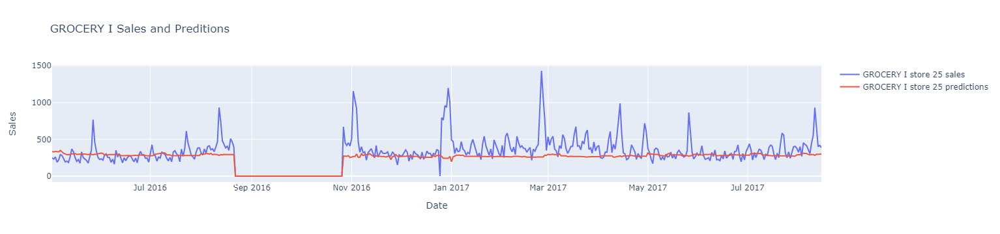

In [17]:
import plotly.graph_objects as go
fig=go.Figure()
fig.add_trace(go.Scatter(x=grocery_df_25['date'],y=grocery_df_25['sales'],mode='lines',name='GROCERY I store 25 sales'))
fig.add_trace(go.Scatter(x=grocery_df_25['date'],y=grocery_df_25['pred'],mode='lines',name='GROCERY I store 25 predictions'))

fig.update_xaxes(title='Date')
fig.update_yaxes(title='Sales')
fig.update_layout(title='GROCERY I Sales and Preditions')
fig.show()

In [18]:
submission=pd.read_csv('./sample_submission.csv')

In [19]:
submission

,id,sales
0,3000888,0.0
1,3000889,0.0
2,3000890,0.0
3,3000891,0.0
4,3000892,0.0
...,...,...
28507,3029395,0.0
28508,3029396,0.0
28509,3029397,0.0
28510,3029398,0.0


In [20]:
x=test.copy(deep=True)

In [21]:
x['pred']=np.nan

In [22]:
for i in test_lr_dict.keys():
    x.loc[x['family']==i,'pred']=test_lr_dict[i]['pred']

In [23]:
submission['sales']=x['pred'].values

In [24]:
submission

,id,sales
0,3000888,2.559516
1,3000889,0.040496
2,3000890,5.168168
3,3000891,1863.292732
4,3000892,0.000000
...,...,...
28507,3029395,502.619244
28508,3029396,82.971153
28509,3029397,99.839715
28510,3029398,1027.249083


In [25]:
submission.to_csv('submission_pooling_family_lr.csv',index=False)

## LGBM With Pooling by Family : 0.69128

In [26]:
import lightgbm as lgb
hyper_params = {
    'task': 'train',
    'boosting_type': 'gbdt',
    'objective': 'regression',
    'metric': ['rmse'],
    'learning_rate': 0.005,
    'verbose': 0,
    "max_depth": 100000,
    "num_leaves": 512,  
    "max_bin": 512,
    "num_iterations": 100000000
}

In [27]:

val_lgbm_df={}
test_lgbm_dict={}
lgbm_rmse_dict={}
lgbm_df={}
for i in  data.family.unique():
    X=data[ (data['family']==i)].drop(['date','sales','log_sales','family'],axis=1)
    y=data[(data['date']<='2016-05-01') & (data['family']==i)].drop(['date'],axis=1)['log_sales']
    lgbm_df[i]=data[data['family']==i]
    X_train=data[(data['date']<='2016-05-01') & (data['family']==i)].drop(['date','sales','log_sales','family'],axis=1)
    y_train=data[(data['date']<='2016-05-01') & (data['family']==i)].drop(['date'],axis=1)['sales']
    X_val=data[(data['date']>'2016-05-01') & (data['date']<='2017-08-15') & (data['family']==i)].drop(['date','sales','log_sales','family'],axis=1)
    y_val=data[(data['date']>'2016-05-01') & (data['date']<='2017-08-15') & (data['family']==i)].drop(['date'],axis=1)['sales']
    test_family_dummies=data[(data['date']>'2017-08-15')  & (data['family']==i)]
    X_test=test_family_dummies.drop(['date','sales','log_sales','family'],axis=1)
    test_family=data[(data['date']>'2017-08-15')  & (data['family']==i)]
    test_lgbm_dict[i]=test_family
    gbm = lgb.LGBMRegressor(**hyper_params)
    gbm.fit(X_train, y_train,
        eval_set=[(X_val, y_val)],
        eval_metric='rmse',
        early_stopping_rounds=10)
    y_pred = gbm.predict(X_val, num_iteration=gbm.best_iteration_)
    y_test = gbm.predict(X_test, num_iteration=gbm.best_iteration_)
    y_all= gbm.predict(X, num_iteration=gbm.best_iteration_)
    lgbm_rmse=np.sqrt(mean_squared_error(y_val,y_pred))
    print('family: ',i,' ,rmse: ',lgbm_rmse)
    lgbm_rmse_dict[i]=lgbm_rmse
    lgbm_df[i]['pred']=y_all
    
    val_lgbm_df[i]=data[(data['date']>'2016-05-01') & (data['date']<='2017-08-15') & (data['family']==i)]
    val_lgbm_df[i]['pred'] = y_pred
    

    test_lgbm_dict[i]['pred'] = y_test

C:\Users\Asma_Ben_nasr\anaconda3\envs\On-boarding\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\Asma_Ben_nasr\anaconda3\envs\On-boarding\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

C:\Users\Asma_Ben_nasr\anaconda3\envs\On-boarding\lib\site-packages\lightgbm\basic.py:1780: UserWarning:

Overriding the parameters from Reference Dataset.

C:\Users\Asma_Ben_nasr\anaconda3\envs\On-boarding\lib\site-packages\lightgbm\basic.py:1513: UserWarning:

categorical_column in param dict is overridden.



[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002264 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[1]	valid_0's rmse: 6.1954
[2]	valid_0's rmse: 6.17999
[3]	valid_0's rmse: 6.16474
[4]	valid_0's rmse: 6.15013
[5]	valid_0's rmse: 6.13518
[6]	valid_0's rmse: 6.12096
[7]	valid_0's rmse: 6.10627
[8]	valid_0's rmse: 6.09226
[9]	valid_0's rmse: 6.07786
[10]	valid_0's rmse: 6.06405
[11]	valid_0's rmse: 6.05044
[12]	valid_0's rmse: 6.0364
[13]	valid_0's rmse: 6.02313
[14]	valid_0's rmse: 6.01006
[15]	valid_0's rmse: 5.99655
[16]	valid_0's rmse: 5.98371
[17]	valid_0's rmse: 5.9705
[18]	valid_0's rmse: 5.95803
[19]	valid_0's rmse: 5.9452
[20]	valid_0's rmse: 5.93288
[21]	valid_0's rmse: 5.9209
[22]	valid_0's rmse: 5.90848
[23]	valid_0's rmse: 5.89664
[24]	valid_0's rmse: 5.88452
[25]	valid_0's rmse: 5.87292
[26]	valid_0's rmse: 5.86131
[27]	valid_0's rmse: 5.84955
[2

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:28: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https:/

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001471 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	valid_0's rmse: 0.794706
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	valid_0's rmse: 0.794452
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	valid_0's rmse: 0.794193
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	valid_0's rmse: 0.793953
[5]	valid_0's rmse: 0.793704
[6]	valid_0's rmse: 0.793476
[7]	valid_0's rmse: 0.79324
[8]	valid_0's rmse: 0.792961
[9]	valid_0's rmse: 0.792693
[10]	valid_0's rmse: 0.792429
[11]	valid_0's rmse: 0.792232
[12]	valid_0's rmse: 0.791981
[13]	valid_0's rmse: 0.791738
[14]	valid_0's rmse: 0.791503
[15]	valid_0's rmse: 0.791297
[16]	valid_0's rmse: 0.79113
[1

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:28: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https:/

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002211 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[1]	valid_0's rmse: 6.57532
[2]	valid_0's rmse: 6.5629
[3]	valid_0's rmse: 6.55058
[4]	valid_0's rmse: 6.53832
[5]	valid_0's rmse: 6.52617
[6]	valid_0's rmse: 6.51409
[7]	valid_0's rmse: 6.50211
[8]	valid_0's rmse: 6.49026
[9]	valid_0's rmse: 6.47849
[10]	valid_0's rmse: 6.4668
[11]	valid_0's rmse: 6.45519
[12]	valid_0's rmse: 6.44366
[13]	valid_0's rmse: 6.43227
[14]	valid_0's rmse: 6.42085
[15]	valid_0's rmse: 6.40914
[16]	valid_0's rmse: 6.39796
[17]	valid_0's rmse: 6.38625
[18]	valid_0's rmse: 6.37523
[19]	valid_0's rmse: 6.36381
[20]	valid_0's rmse: 6.35299
[21]	valid_0's rmse: 6.34174
[22]	valid_0's rmse: 6.33102
[23]	valid_0's rmse: 6.31972
[24]	valid_0's rmse: 6.30851
[25]	valid_0's rmse: 6.29779
[26]	valid_0's rmse: 6.28677
[27]	valid_0's rmse: 6.27641

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:28: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https:/

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002430 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[1]	valid_0's rmse: 2913.14
[2]	valid_0's rmse: 2904.62
[3]	valid_0's rmse: 2896.15
[4]	valid_0's rmse: 2887.75
[5]	valid_0's rmse: 2879.33
[6]	valid_0's rmse: 2870.93
[7]	valid_0's rmse: 2862.63
[8]	valid_0's rmse: 2854.38
[9]	valid_0's rmse: 2846.07
[10]	valid_0's rmse: 2837.83
[11]	valid_0's rmse: 2829.57
[12]	valid_0's rmse: 2821.5
[13]	valid_0's rmse: 2813.36
[14]	valid_0's rmse: 2805.39
[15]	valid_0's rmse: 2797.41
[16]	valid_0's rmse: 2789.17
[17]	valid_0's rmse: 2780.99
[18]	valid_0's rmse: 2772.88
[19]	valid_0's rmse: 2764.96
[20]	valid_0's rmse: 2757.05
[21]	valid_0's rmse: 2749.4
[22]	valid_0's rmse: 2741.46
[23]	valid_0's rmse: 2733.65
[24]	valid_0's rmse: 2725.95
[25]	valid_0's rmse: 2718.35
[26]	valid_0's rmse: 2710.6
[27]	valid_0's rmse: 2702.99


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:28: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https:/

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002024 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[1]	valid_0's rmse: 1.04587
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[2]	valid_0's rmse: 1.04587
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[3]	valid_0's rmse: 1.04587
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\anaconda3\envs\On-boarding\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument inste

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002264 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[1]	valid_0's rmse: 423.12
[2]	valid_0's rmse: 421.655
[3]	valid_0's rmse: 420.201
[4]	valid_0's rmse: 418.757
[5]	valid_0's rmse: 417.322
[6]	valid_0's rmse: 415.896
[7]	valid_0's rmse: 414.479
[8]	valid_0's rmse: 413.068
[9]	valid_0's rmse: 411.674
[10]	valid_0's rmse: 410.294
[11]	valid_0's rmse: 408.916
[12]	valid_0's rmse: 407.553
[13]	valid_0's rmse: 406.191
[14]	valid_0's rmse: 404.831
[15]	valid_0's rmse: 403.475
[16]	valid_0's rmse: 402.13
[17]	valid_0's rmse: 400.795
[18]	valid_0's rmse: 399.472
[19]	valid_0's rmse: 398.152
[20]	valid_0's rmse: 396.827
[21]	valid_0's rmse: 395.536
[22]	valid_0's rmse: 394.232
[23]	valid_0's rmse: 392.954
[24]	valid_0's rmse: 391.671
[25]	valid_0's rmse: 390.387
[26]	valid_0's rmse: 389.11
[27]	valid_0's rmse: 387.844


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:28: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https:/

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002170 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[1]	valid_0's rmse: 16.9465
[2]	valid_0's rmse: 16.9207
[3]	valid_0's rmse: 16.8952
[4]	valid_0's rmse: 16.87
[5]	valid_0's rmse: 16.8451
[6]	valid_0's rmse: 16.8205
[7]	valid_0's rmse: 16.7962
[8]	valid_0's rmse: 16.7725
[9]	valid_0's rmse: 16.7489
[10]	valid_0's rmse: 16.7255
[11]	valid_0's rmse: 16.7022
[12]	valid_0's rmse: 16.6798
[13]	valid_0's rmse: 16.6573
[14]	valid_0's rmse: 16.6347
[15]	valid_0's rmse: 16.6131
[16]	valid_0's rmse: 16.5917
[17]	valid_0's rmse: 16.5699
[18]	valid_0's rmse: 16.5491
[19]	valid_0's rmse: 16.5277
[20]	valid_0's rmse: 16.5073
[21]	valid_0's rmse: 16.4872
[22]	valid_0's rmse: 16.4667
[23]	valid_0's rmse: 16.4468
[24]	valid_0's rmse: 16.4267
[25]	valid_0's rmse: 16.4074
[26]	valid_0's rmse: 16.3886
[27]	valid_0's rmse: 16.3691

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:28: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https:/

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003329 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[1]	valid_0's rmse: 772.077
[2]	valid_0's rmse: 769.504
[3]	valid_0's rmse: 766.959
[4]	valid_0's rmse: 764.409
[5]	valid_0's rmse: 761.901
[6]	valid_0's rmse: 759.399
[7]	valid_0's rmse: 756.905
[8]	valid_0's rmse: 754.505
[9]	valid_0's rmse: 752.068
[10]	valid_0's rmse: 749.631
[11]	valid_0's rmse: 747.261
[12]	valid_0's rmse: 744.931
[13]	valid_0's rmse: 742.735
[14]	valid_0's rmse: 740.531
[15]	valid_0's rmse: 738.36
[16]	valid_0's rmse: 736.194
[17]	valid_0's rmse: 734.034
[18]	valid_0's rmse: 731.893
[19]	valid_0's rmse: 729.763
[20]	valid_0's rmse: 727.653
[21]	valid_0's rmse: 725.57
[22]	valid_0's rmse: 723.385
[23]	valid_0's rmse: 721.308
[24]	valid_0's rmse: 719.263
[25]	valid_0's rmse: 717.23
[26]	valid_0's rmse: 715.219
[27]	valid_0's rmse: 713.225


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:28: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https:/

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002942 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[1]	valid_0's rmse: 767.198
[2]	valid_0's rmse: 764.493
[3]	valid_0's rmse: 761.807
[4]	valid_0's rmse: 759.141
[5]	valid_0's rmse: 756.483
[6]	valid_0's rmse: 753.849
[7]	valid_0's rmse: 751.238
[8]	valid_0's rmse: 748.634
[9]	valid_0's rmse: 746.045
[10]	valid_0's rmse: 743.464
[11]	valid_0's rmse: 740.904
[12]	valid_0's rmse: 738.234
[13]	valid_0's rmse: 735.586
[14]	valid_0's rmse: 732.948
[15]	valid_0's rmse: 730.333
[16]	valid_0's rmse: 727.847
[17]	valid_0's rmse: 725.257
[18]	valid_0's rmse: 722.69
[19]	valid_0's rmse: 720.135
[20]	valid_0's rmse: 717.605
[21]	valid_0's rmse: 715.197
[22]	valid_0's rmse: 712.689
[23]	valid_0's rmse: 710.201
[24]	valid_0's rmse: 707.732
[25]	valid_0's rmse: 705.384
[26]	valid_0's rmse: 703.035
[27]	valid_0's rmse: 700.61

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:28: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https:/

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003028 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[1]	valid_0's rmse: 218.46
[2]	valid_0's rmse: 217.667
[3]	valid_0's rmse: 216.884
[4]	valid_0's rmse: 216.107
[5]	valid_0's rmse: 215.345
[6]	valid_0's rmse: 214.576
[7]	valid_0's rmse: 213.813
[8]	valid_0's rmse: 213.036
[9]	valid_0's rmse: 212.273
[10]	valid_0's rmse: 211.51
[11]	valid_0's rmse: 210.752
[12]	valid_0's rmse: 209.999
[13]	valid_0's rmse: 209.251
[14]	valid_0's rmse: 208.508
[15]	valid_0's rmse: 207.772
[16]	valid_0's rmse: 207.038
[17]	valid_0's rmse: 206.313
[18]	valid_0's rmse: 205.593
[19]	valid_0's rmse: 204.877
[20]	valid_0's rmse: 204.163
[21]	valid_0's rmse: 203.46
[22]	valid_0's rmse: 202.758
[23]	valid_0's rmse: 202.062
[24]	valid_0's rmse: 201.369
[25]	valid_0's rmse: 200.683
[26]	valid_0's rmse: 200.002
[27]	valid_0's rmse: 199.327


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:28: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https:/

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002556 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[1]	valid_0's rmse: 181.193
[2]	valid_0's rmse: 180.685
[3]	valid_0's rmse: 180.181
[4]	valid_0's rmse: 179.68
[5]	valid_0's rmse: 179.183
[6]	valid_0's rmse: 178.692
[7]	valid_0's rmse: 178.205
[8]	valid_0's rmse: 177.722
[9]	valid_0's rmse: 177.239
[10]	valid_0's rmse: 176.762
[11]	valid_0's rmse: 176.286
[12]	valid_0's rmse: 175.815
[13]	valid_0's rmse: 175.346
[14]	valid_0's rmse: 174.883
[15]	valid_0's rmse: 174.423
[16]	valid_0's rmse: 173.966
[17]	valid_0's rmse: 173.51
[18]	valid_0's rmse: 173.059
[19]	valid_0's rmse: 172.61
[20]	valid_0's rmse: 172.166
[21]	valid_0's rmse: 171.724
[22]	valid_0's rmse: 171.286
[23]	valid_0's rmse: 170.851
[24]	valid_0's rmse: 170.42
[25]	valid_0's rmse: 169.991
[26]	valid_0's rmse: 169.566
[27]	valid_0's rmse: 169.145
[

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:28: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https:/

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002480 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[1]	valid_0's rmse: 318.233
[2]	valid_0's rmse: 317.518
[3]	valid_0's rmse: 316.808
[4]	valid_0's rmse: 316.104
[5]	valid_0's rmse: 315.329
[6]	valid_0's rmse: 314.56
[7]	valid_0's rmse: 313.796
[8]	valid_0's rmse: 313.038
[9]	valid_0's rmse: 312.282
[10]	valid_0's rmse: 311.539
[11]	valid_0's rmse: 310.796
[12]	valid_0's rmse: 310.056
[13]	valid_0's rmse: 309.331
[14]	valid_0's rmse: 308.606
[15]	valid_0's rmse: 307.965
[16]	valid_0's rmse: 307.236
[17]	valid_0's rmse: 306.532
[18]	valid_0's rmse: 305.817
[19]	valid_0's rmse: 305.116
[20]	valid_0's rmse: 304.419
[21]	valid_0's rmse: 303.734
[22]	valid_0's rmse: 303.048
[23]	valid_0's rmse: 302.369
[24]	valid_0's rmse: 301.692
[25]	valid_0's rmse: 301.024
[26]	valid_0's rmse: 300.361
[27]	valid_0's rmse: 299.70

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:28: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https:/

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001961 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[1]	valid_0's rmse: 3252.2
[2]	valid_0's rmse: 3242.71
[3]	valid_0's rmse: 3233.14
[4]	valid_0's rmse: 3223.57
[5]	valid_0's rmse: 3214.16
[6]	valid_0's rmse: 3204.8
[7]	valid_0's rmse: 3195.54
[8]	valid_0's rmse: 3186.42
[9]	valid_0's rmse: 3177.3
[10]	valid_0's rmse: 3168.36
[11]	valid_0's rmse: 3159.39
[12]	valid_0's rmse: 3150.5
[13]	valid_0's rmse: 3141.58
[14]	valid_0's rmse: 3132.74
[15]	valid_0's rmse: 3123.89
[16]	valid_0's rmse: 3115.2
[17]	valid_0's rmse: 3106.61
[18]	valid_0's rmse: 3098.09
[19]	valid_0's rmse: 3089.79
[20]	valid_0's rmse: 3081.3
[21]	valid_0's rmse: 3073.01
[22]	valid_0's rmse: 3064.91
[23]	valid_0's rmse: 3056.72
[24]	valid_0's rmse: 3048.67
[25]	valid_0's rmse: 3040.72
[26]	valid_0's rmse: 3032.68
[27]	valid_0's rmse: 3024.73
[28

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:28: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https:/

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002061 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[1]	valid_0's rmse: 33.1223
[2]	valid_0's rmse: 33.0488
[3]	valid_0's rmse: 32.9759
[4]	valid_0's rmse: 32.9035
[5]	valid_0's rmse: 32.8318
[6]	valid_0's rmse: 32.7605
[7]	valid_0's rmse: 32.6898
[8]	valid_0's rmse: 32.6197
[9]	valid_0's rmse: 32.5502
[10]	valid_0's rmse: 32.4808
[11]	valid_0's rmse: 32.4118
[12]	valid_0's rmse: 32.3433
[13]	valid_0's rmse: 32.2754
[14]	valid_0's rmse: 32.2082
[15]	valid_0's rmse: 32.1413
[16]	valid_0's rmse: 32.0748
[17]	valid_0's rmse: 32.0091
[18]	valid_0's rmse: 31.9439
[19]	valid_0's rmse: 31.8785
[20]	valid_0's rmse: 31.8137
[21]	valid_0's rmse: 31.7499
[22]	valid_0's rmse: 31.6861
[23]	valid_0's rmse: 31.6233
[24]	valid_0's rmse: 31.5604
[25]	valid_0's rmse: 31.4988
[26]	valid_0's rmse: 31.4369
[27]	valid_0's rmse: 31.37

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:28: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https:/

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002249 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[1]	valid_0's rmse: 1.73369
[2]	valid_0's rmse: 1.73237
[3]	valid_0's rmse: 1.73106
[4]	valid_0's rmse: 1.72971
[5]	valid_0's rmse: 1.72837
[6]	valid_0's rmse: 1.72708
[7]	valid_0's rmse: 1.72579
[8]	valid_0's rmse: 1.72453
[9]	valid_0's rmse: 1.72328
[10]	valid_0's rmse: 1.72202
[11]	valid_0's rmse: 1.72082
[12]	valid_0's rmse: 1.71958
[13]	valid_0's rmse: 1.71837
[14]	valid_0's rmse: 1.71719
[15]	valid_0's rmse: 1.71604
[16]	valid_0's rmse: 1.71486
[17]	valid_0's rmse: 1.71369
[18]	valid_0's rmse: 1.71257
[19]	valid_0's rmse: 1.71144
[20]	valid_0's rmse: 1.71035
[21]	valid_0's rmse: 1.70925
[22]	valid_0's rmse: 1.70815
[23]	valid_0's rmse: 1.70708
[24]	valid_0's rmse: 1.70602
[25]	valid_0's rmse: 1.70498
[26]	valid_0's rmse: 1.70394
[27]	valid_0's rmse: 1.702

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:28: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https:/

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002564 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[1]	valid_0's rmse: 42.8208
[2]	valid_0's rmse: 42.7467
[3]	valid_0's rmse: 42.6732
[4]	valid_0's rmse: 42.6015
[5]	valid_0's rmse: 42.5296
[6]	valid_0's rmse: 42.4598
[7]	valid_0's rmse: 42.3886
[8]	valid_0's rmse: 42.3203
[9]	valid_0's rmse: 42.2516
[10]	valid_0's rmse: 42.1828
[11]	valid_0's rmse: 42.113
[12]	valid_0's rmse: 42.0424
[13]	valid_0's rmse: 41.9741
[14]	valid_0's rmse: 41.9057
[15]	valid_0's rmse: 41.8387
[16]	valid_0's rmse: 41.7723
[17]	valid_0's rmse: 41.7065
[18]	valid_0's rmse: 41.6407
[19]	valid_0's rmse: 41.5738
[20]	valid_0's rmse: 41.5092
[21]	valid_0's rmse: 41.4454
[22]	valid_0's rmse: 41.3823
[23]	valid_0's rmse: 41.3175
[24]	valid_0's rmse: 41.2552
[25]	valid_0's rmse: 41.1941
[26]	valid_0's rmse: 41.1307
[27]	valid_0's rmse: 41.069

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:28: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https:/

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002128 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[1]	valid_0's rmse: 33.8549
[2]	valid_0's rmse: 33.7439
[3]	valid_0's rmse: 33.6535
[4]	valid_0's rmse: 33.5467
[5]	valid_0's rmse: 33.4404
[6]	valid_0's rmse: 33.3524
[7]	valid_0's rmse: 33.2508
[8]	valid_0's rmse: 33.1483
[9]	valid_0's rmse: 33.0674
[10]	valid_0's rmse: 32.9676
[11]	valid_0's rmse: 32.8723
[12]	valid_0's rmse: 32.7934
[13]	valid_0's rmse: 32.7001
[14]	valid_0's rmse: 32.609
[15]	valid_0's rmse: 32.534
[16]	valid_0's rmse: 32.4441
[17]	valid_0's rmse: 32.3561
[18]	valid_0's rmse: 32.2838
[19]	valid_0's rmse: 32.1977
[20]	valid_0's rmse: 32.1103
[21]	valid_0's rmse: 32.0411
[22]	valid_0's rmse: 31.9597
[23]	valid_0's rmse: 31.8885
[24]	valid_0's rmse: 31.8225
[25]	valid_0's rmse: 31.7443
[26]	valid_0's rmse: 31.674
[27]	valid_0's rmse: 31.5928


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:28: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https:/

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001846 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[1]	valid_0's rmse: 0.924856
[2]	valid_0's rmse: 0.923732
[3]	valid_0's rmse: 0.922638
[4]	valid_0's rmse: 0.921557
[5]	valid_0's rmse: 0.920478
[6]	valid_0's rmse: 0.919425
[7]	valid_0's rmse: 0.918339
[8]	valid_0's rmse: 0.917377
[9]	valid_0's rmse: 0.916302
[10]	valid_0's rmse: 0.915354
[11]	valid_0's rmse: 0.914332
[12]	valid_0's rmse: 0.913407
[13]	valid_0's rmse: 0.912385
[14]	valid_0's rmse: 0.911357
[15]	valid_0's rmse: 0.910482
[16]	valid_0's rmse: 0.909507
[17]	valid_0's rmse: 0.908642
[18]	valid_0's rmse: 0.907685
[19]	valid_0's rmse: 0.906846
[20]	valid_0's rmse: 0.905884
[21]	valid_0's rmse: 0.905051
[22]	valid_0's rmse: 0.904102
[23]	valid_0's rmse: 0.903258
[24]	valid_0's rmse: 0.902362
[25]	valid_0's rmse: 0.901484
[26]	valid_0's rmse: 0.900683


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:28: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https:/

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001828 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[1]	valid_0's rmse: 257.669
[2]	valid_0's rmse: 256.805
[3]	valid_0's rmse: 255.947
[4]	valid_0's rmse: 255.095
[5]	valid_0's rmse: 254.255
[6]	valid_0's rmse: 253.42
[7]	valid_0's rmse: 252.591
[8]	valid_0's rmse: 251.764
[9]	valid_0's rmse: 250.946
[10]	valid_0's rmse: 250.133
[11]	valid_0's rmse: 249.322
[12]	valid_0's rmse: 248.517
[13]	valid_0's rmse: 247.719
[14]	valid_0's rmse: 246.928
[15]	valid_0's rmse: 246.138
[16]	valid_0's rmse: 245.356
[17]	valid_0's rmse: 244.582
[18]	valid_0's rmse: 243.81
[19]	valid_0's rmse: 243.039
[20]	valid_0's rmse: 242.278
[21]	valid_0's rmse: 241.527
[22]	valid_0's rmse: 240.767
[23]	valid_0's rmse: 240.026
[24]	valid_0's rmse: 239.288
[25]	valid_0's rmse: 238.546
[26]	valid_0's rmse: 237.817
[27]	valid_0's rmse: 237.095

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:28: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https:/

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002303 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[1]	valid_0's rmse: 16.566
[2]	valid_0's rmse: 16.537
[3]	valid_0's rmse: 16.5083
[4]	valid_0's rmse: 16.48
[5]	valid_0's rmse: 16.452
[6]	valid_0's rmse: 16.4243
[7]	valid_0's rmse: 16.3969
[8]	valid_0's rmse: 16.3694
[9]	valid_0's rmse: 16.3423
[10]	valid_0's rmse: 16.3158
[11]	valid_0's rmse: 16.2892
[12]	valid_0's rmse: 16.2634
[13]	valid_0's rmse: 16.2374
[14]	valid_0's rmse: 16.2125
[15]	valid_0's rmse: 16.1886
[16]	valid_0's rmse: 16.1635
[17]	valid_0's rmse: 16.1396
[18]	valid_0's rmse: 16.1156
[19]	valid_0's rmse: 16.0921
[20]	valid_0's rmse: 16.0682
[21]	valid_0's rmse: 16.0451
[22]	valid_0's rmse: 16.0223
[23]	valid_0's rmse: 15.9999
[24]	valid_0's rmse: 15.9776
[25]	valid_0's rmse: 15.9553
[26]	valid_0's rmse: 15.9338
[27]	valid_0's rmse: 15.9124
[2

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:28: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https:/

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002051 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[1]	valid_0's rmse: 21.3544
[2]	valid_0's rmse: 21.3373
[3]	valid_0's rmse: 21.3202
[4]	valid_0's rmse: 21.3032
[5]	valid_0's rmse: 21.2866
[6]	valid_0's rmse: 21.2699
[7]	valid_0's rmse: 21.2532
[8]	valid_0's rmse: 21.2367
[9]	valid_0's rmse: 21.2204
[10]	valid_0's rmse: 21.204
[11]	valid_0's rmse: 21.1879
[12]	valid_0's rmse: 21.1719
[13]	valid_0's rmse: 21.1557
[14]	valid_0's rmse: 21.1399
[15]	valid_0's rmse: 21.1241
[16]	valid_0's rmse: 21.1083
[17]	valid_0's rmse: 21.0926
[18]	valid_0's rmse: 21.0771
[19]	valid_0's rmse: 21.0619
[20]	valid_0's rmse: 21.0469
[21]	valid_0's rmse: 21.0323
[22]	valid_0's rmse: 21.0176
[23]	valid_0's rmse: 21.0028
[24]	valid_0's rmse: 20.9879
[25]	valid_0's rmse: 20.9733
[26]	valid_0's rmse: 20.9587
[27]	valid_0's rmse: 20.944

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:28: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https:/

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002342 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[1]	valid_0's rmse: 10.9477
[2]	valid_0's rmse: 10.9372
[3]	valid_0's rmse: 10.9267
[4]	valid_0's rmse: 10.9165
[5]	valid_0's rmse: 10.9066
[6]	valid_0's rmse: 10.8969
[7]	valid_0's rmse: 10.8874
[8]	valid_0's rmse: 10.8779
[9]	valid_0's rmse: 10.8686
[10]	valid_0's rmse: 10.8595
[11]	valid_0's rmse: 10.8504
[12]	valid_0's rmse: 10.8414
[13]	valid_0's rmse: 10.8326
[14]	valid_0's rmse: 10.8239
[15]	valid_0's rmse: 10.8153
[16]	valid_0's rmse: 10.8069
[17]	valid_0's rmse: 10.7987
[18]	valid_0's rmse: 10.7904
[19]	valid_0's rmse: 10.7823
[20]	valid_0's rmse: 10.7743
[21]	valid_0's rmse: 10.7664
[22]	valid_0's rmse: 10.7585
[23]	valid_0's rmse: 10.7509
[24]	valid_0's rmse: 10.7433
[25]	valid_0's rmse: 10.7359
[26]	valid_0's rmse: 10.7285
[27]	valid_0's rmse: 10.72

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:28: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https:/

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002171 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[1]	valid_0's rmse: 120.891
[2]	valid_0's rmse: 120.58
[3]	valid_0's rmse: 120.266
[4]	valid_0's rmse: 119.962
[5]	valid_0's rmse: 119.66
[6]	valid_0's rmse: 119.357
[7]	valid_0's rmse: 119.062
[8]	valid_0's rmse: 118.767
[9]	valid_0's rmse: 118.479
[10]	valid_0's rmse: 118.19
[11]	valid_0's rmse: 117.909
[12]	valid_0's rmse: 117.628
[13]	valid_0's rmse: 117.342
[14]	valid_0's rmse: 117.064
[15]	valid_0's rmse: 116.787
[16]	valid_0's rmse: 116.518
[17]	valid_0's rmse: 116.251
[18]	valid_0's rmse: 115.989
[19]	valid_0's rmse: 115.728
[20]	valid_0's rmse: 115.47
[21]	valid_0's rmse: 115.214
[22]	valid_0's rmse: 114.961
[23]	valid_0's rmse: 114.71
[24]	valid_0's rmse: 114.462
[25]	valid_0's rmse: 114.218
[26]	valid_0's rmse: 113.978
[27]	valid_0's rmse: 113.739
[2

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:28: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https:/

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002171 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[1]	valid_0's rmse: 9.11788
[2]	valid_0's rmse: 9.10911
[3]	valid_0's rmse: 9.10051
[4]	valid_0's rmse: 9.0919
[5]	valid_0's rmse: 9.08358
[6]	valid_0's rmse: 9.07543
[7]	valid_0's rmse: 9.06708
[8]	valid_0's rmse: 9.05914
[9]	valid_0's rmse: 9.05112
[10]	valid_0's rmse: 9.04257
[11]	valid_0's rmse: 9.03463
[12]	valid_0's rmse: 9.02679
[13]	valid_0's rmse: 9.0183
[14]	valid_0's rmse: 9.01088
[15]	valid_0's rmse: 9.00268
[16]	valid_0's rmse: 8.99436
[17]	valid_0's rmse: 8.98681
[18]	valid_0's rmse: 8.97892
[19]	valid_0's rmse: 8.9707
[20]	valid_0's rmse: 8.96373
[21]	valid_0's rmse: 8.95495
[22]	valid_0's rmse: 8.94756
[23]	valid_0's rmse: 8.93975
[24]	valid_0's rmse: 8.93237
[25]	valid_0's rmse: 8.92402
[26]	valid_0's rmse: 8.91582
[27]	valid_0's rmse: 8.90777


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:28: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https:/

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002712 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[1]	valid_0's rmse: 665.275
[2]	valid_0's rmse: 664.58
[3]	valid_0's rmse: 663.891
[4]	valid_0's rmse: 663.206
[5]	valid_0's rmse: 662.53
[6]	valid_0's rmse: 661.86
[7]	valid_0's rmse: 661.196
[8]	valid_0's rmse: 660.539
[9]	valid_0's rmse: 659.886
[10]	valid_0's rmse: 659.238
[11]	valid_0's rmse: 658.596
[12]	valid_0's rmse: 657.957
[13]	valid_0's rmse: 657.328
[14]	valid_0's rmse: 656.704
[15]	valid_0's rmse: 656.087
[16]	valid_0's rmse: 655.472
[17]	valid_0's rmse: 654.866
[18]	valid_0's rmse: 654.263
[19]	valid_0's rmse: 653.667
[20]	valid_0's rmse: 653.078
[21]	valid_0's rmse: 652.493
[22]	valid_0's rmse: 651.911
[23]	valid_0's rmse: 651.337
[24]	valid_0's rmse: 650.769
[25]	valid_0's rmse: 650.204
[26]	valid_0's rmse: 649.646
[27]	valid_0's rmse: 649.095


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:28: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https:/

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002266 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[1]	valid_0's rmse: 247.756
[2]	valid_0's rmse: 247.009
[3]	valid_0's rmse: 246.254
[4]	valid_0's rmse: 245.522
[5]	valid_0's rmse: 244.779
[6]	valid_0's rmse: 244.045
[7]	valid_0's rmse: 243.325
[8]	valid_0's rmse: 242.6
[9]	valid_0's rmse: 241.893
[10]	valid_0's rmse: 241.196
[11]	valid_0's rmse: 240.497
[12]	valid_0's rmse: 239.803
[13]	valid_0's rmse: 239.124
[14]	valid_0's rmse: 238.442
[15]	valid_0's rmse: 237.765
[16]	valid_0's rmse: 237.098
[17]	valid_0's rmse: 236.443
[18]	valid_0's rmse: 235.779
[19]	valid_0's rmse: 235.12
[20]	valid_0's rmse: 234.465
[21]	valid_0's rmse: 233.793
[22]	valid_0's rmse: 233.123
[23]	valid_0's rmse: 232.466
[24]	valid_0's rmse: 231.802
[25]	valid_0's rmse: 231.15
[26]	valid_0's rmse: 230.505
[27]	valid_0's rmse: 229.863
[

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:28: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https:/

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002301 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[1]	valid_0's rmse: 11.2418
[2]	valid_0's rmse: 11.227
[3]	valid_0's rmse: 11.2123
[4]	valid_0's rmse: 11.1977
[5]	valid_0's rmse: 11.1831
[6]	valid_0's rmse: 11.1687
[7]	valid_0's rmse: 11.1546
[8]	valid_0's rmse: 11.1404
[9]	valid_0's rmse: 11.1264
[10]	valid_0's rmse: 11.1122
[11]	valid_0's rmse: 11.0985
[12]	valid_0's rmse: 11.0845
[13]	valid_0's rmse: 11.0701
[14]	valid_0's rmse: 11.0568
[15]	valid_0's rmse: 11.0431
[16]	valid_0's rmse: 11.0291
[17]	valid_0's rmse: 11.016
[18]	valid_0's rmse: 11.0022
[19]	valid_0's rmse: 10.9885
[20]	valid_0's rmse: 10.9758
[21]	valid_0's rmse: 10.9624
[22]	valid_0's rmse: 10.9498
[23]	valid_0's rmse: 10.937
[24]	valid_0's rmse: 10.9239
[25]	valid_0's rmse: 10.9116
[26]	valid_0's rmse: 10.8987
[27]	valid_0's rmse: 10.8859


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:28: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https:/

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002625 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[1]	valid_0's rmse: 13.2138
[2]	valid_0's rmse: 13.1917
[3]	valid_0's rmse: 13.1697
[4]	valid_0's rmse: 13.1481
[5]	valid_0's rmse: 13.1266
[6]	valid_0's rmse: 13.1054
[7]	valid_0's rmse: 13.0844
[8]	valid_0's rmse: 13.0635
[9]	valid_0's rmse: 13.0429
[10]	valid_0's rmse: 13.0224
[11]	valid_0's rmse: 13.0019
[12]	valid_0's rmse: 12.982
[13]	valid_0's rmse: 12.9622
[14]	valid_0's rmse: 12.9428
[15]	valid_0's rmse: 12.9234
[16]	valid_0's rmse: 12.9035
[17]	valid_0's rmse: 12.8839
[18]	valid_0's rmse: 12.8644
[19]	valid_0's rmse: 12.8451
[20]	valid_0's rmse: 12.8269
[21]	valid_0's rmse: 12.8079
[22]	valid_0's rmse: 12.7891
[23]	valid_0's rmse: 12.7706
[24]	valid_0's rmse: 12.7523
[25]	valid_0's rmse: 12.734
[26]	valid_0's rmse: 12.7169
[27]	valid_0's rmse: 12.6999

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:28: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https:/

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002511 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[1]	valid_0's rmse: 427.984
[2]	valid_0's rmse: 426.358
[3]	valid_0's rmse: 424.742
[4]	valid_0's rmse: 423.126
[5]	valid_0's rmse: 421.525
[6]	valid_0's rmse: 419.937
[7]	valid_0's rmse: 418.359
[8]	valid_0's rmse: 416.789
[9]	valid_0's rmse: 415.231
[10]	valid_0's rmse: 413.683
[11]	valid_0's rmse: 412.147
[12]	valid_0's rmse: 410.618
[13]	valid_0's rmse: 409.1
[14]	valid_0's rmse: 407.593
[15]	valid_0's rmse: 406.096
[16]	valid_0's rmse: 404.608
[17]	valid_0's rmse: 403.124
[18]	valid_0's rmse: 401.654
[19]	valid_0's rmse: 400.198
[20]	valid_0's rmse: 398.75
[21]	valid_0's rmse: 397.311
[22]	valid_0's rmse: 395.874
[23]	valid_0's rmse: 394.448
[24]	valid_0's rmse: 393.044
[25]	valid_0's rmse: 391.634
[26]	valid_0's rmse: 390.251
[27]	valid_0's rmse: 388.871


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:28: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https:/

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002208 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[1]	valid_0's rmse: 96.4155
[2]	valid_0's rmse: 95.9883
[3]	valid_0's rmse: 95.5647
[4]	valid_0's rmse: 95.1426
[5]	valid_0's rmse: 94.7239
[6]	valid_0's rmse: 94.3066
[7]	valid_0's rmse: 93.8926
[8]	valid_0's rmse: 93.4811
[9]	valid_0's rmse: 93.0708
[10]	valid_0's rmse: 92.664
[11]	valid_0's rmse: 92.2607
[12]	valid_0's rmse: 91.8588
[13]	valid_0's rmse: 91.4589
[14]	valid_0's rmse: 91.0619
[15]	valid_0's rmse: 90.6691
[16]	valid_0's rmse: 90.2764
[17]	valid_0's rmse: 89.8886
[18]	valid_0's rmse: 89.5022
[19]	valid_0's rmse: 89.1179
[20]	valid_0's rmse: 88.7367
[21]	valid_0's rmse: 88.3572
[22]	valid_0's rmse: 87.9801
[23]	valid_0's rmse: 87.606
[24]	valid_0's rmse: 87.2344
[25]	valid_0's rmse: 86.8636
[26]	valid_0's rmse: 86.4958
[27]	valid_0's rmse: 86.1305

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:28: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https:/

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005858 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[1]	valid_0's rmse: 2736.92
[2]	valid_0's rmse: 2725.6
[3]	valid_0's rmse: 2714.43
[4]	valid_0's rmse: 2703.32
[5]	valid_0's rmse: 2692.21
[6]	valid_0's rmse: 2681.41
[7]	valid_0's rmse: 2670.51
[8]	valid_0's rmse: 2659.62
[9]	valid_0's rmse: 2649.02
[10]	valid_0's rmse: 2638.51
[11]	valid_0's rmse: 2627.83
[12]	valid_0's rmse: 2617.44
[13]	valid_0's rmse: 2607.16
[14]	valid_0's rmse: 2596.74
[15]	valid_0's rmse: 2586.6
[16]	valid_0's rmse: 2576.54
[17]	valid_0's rmse: 2566.31
[18]	valid_0's rmse: 2556.38
[19]	valid_0's rmse: 2546.44
[20]	valid_0's rmse: 2536.53
[21]	valid_0's rmse: 2526.55
[22]	valid_0's rmse: 2516.77
[23]	valid_0's rmse: 2507.02
[24]	valid_0's rmse: 2497.16
[25]	valid_0's rmse: 2487.58
[26]	valid_0's rmse: 2478.12
[27]	valid_0's rmse: 2471.76

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:28: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https:/

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002625 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[1]	valid_0's rmse: 37.4664
[2]	valid_0's rmse: 37.3812
[3]	valid_0's rmse: 37.2967
[4]	valid_0's rmse: 37.2129
[5]	valid_0's rmse: 37.1299
[6]	valid_0's rmse: 37.0477
[7]	valid_0's rmse: 36.9662
[8]	valid_0's rmse: 36.8854
[9]	valid_0's rmse: 36.8285
[10]	valid_0's rmse: 36.7722
[11]	valid_0's rmse: 36.6935
[12]	valid_0's rmse: 36.6378
[13]	valid_0's rmse: 36.5832
[14]	valid_0's rmse: 36.5062
[15]	valid_0's rmse: 36.4524
[16]	valid_0's rmse: 36.3988
[17]	valid_0's rmse: 36.3236
[18]	valid_0's rmse: 36.2714
[19]	valid_0's rmse: 36.2194
[20]	valid_0's rmse: 36.146
[21]	valid_0's rmse: 36.0953
[22]	valid_0's rmse: 36.0452
[23]	valid_0's rmse: 35.9953
[24]	valid_0's rmse: 35.924
[25]	valid_0's rmse: 35.8754
[26]	valid_0's rmse: 35.8267
[27]	valid_0's rmse: 35.7571

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:28: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https:/

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001939 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[1]	valid_0's rmse: 31.4609
[2]	valid_0's rmse: 31.3089
[3]	valid_0's rmse: 31.1578
[4]	valid_0's rmse: 31.0076
[5]	valid_0's rmse: 30.8583
[6]	valid_0's rmse: 30.7099
[7]	valid_0's rmse: 30.5624
[8]	valid_0's rmse: 30.4156
[9]	valid_0's rmse: 30.2701
[10]	valid_0's rmse: 30.1253
[11]	valid_0's rmse: 29.9815
[12]	valid_0's rmse: 29.8382
[13]	valid_0's rmse: 29.6958
[14]	valid_0's rmse: 29.5547
[15]	valid_0's rmse: 29.4141
[16]	valid_0's rmse: 29.2743
[17]	valid_0's rmse: 29.1353
[18]	valid_0's rmse: 28.9975
[19]	valid_0's rmse: 28.8605
[20]	valid_0's rmse: 28.7241
[21]	valid_0's rmse: 28.5893
[22]	valid_0's rmse: 28.4548
[23]	valid_0's rmse: 28.3209
[24]	valid_0's rmse: 28.1881
[25]	valid_0's rmse: 28.0562
[26]	valid_0's rmse: 27.9247
[27]	valid_0's rmse: 27.79

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:28: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\646824889.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https:/

In [28]:
grocery_df= val_lgbm_df['BREAD/BAKERY']

In [29]:
grocery_df_25=grocery_df[grocery_df['store_nbr']==25]
dates = grocery_df_25.date.unique()
grocery_df_25 = grocery_df_25.set_index('date').resample('1D').last().ffill().reset_index()
grocery_df_25.sales = grocery_df_25.sales.where(grocery_df_25.date.isin(dates), 0)

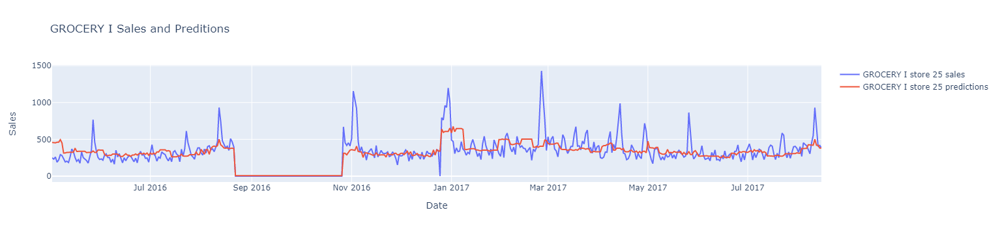

In [30]:
import plotly.graph_objects as go
fig=go.Figure()
fig.add_trace(go.Scatter(x=grocery_df_25['date'],y=grocery_df_25['sales'],mode='lines',name='GROCERY I store 25 sales'))
fig.add_trace(go.Scatter(x=grocery_df_25['date'],y=grocery_df_25['pred'],mode='lines',name='GROCERY I store 25 predictions'))

fig.update_xaxes(title='Date')
fig.update_yaxes(title='Sales')
fig.update_layout(title='GROCERY I Sales and Preditions')
fig.show()

In [31]:
submission=pd.read_csv('./sample_submission.csv')

In [32]:
x=test.copy(deep=True)

In [33]:
x['pred']=np.nan

In [34]:
for i in test_lgbm_dict.keys():
    x.loc[x['family']==i,'pred']=test_lgbm_dict[i]['pred'].clip(0)

In [35]:
submission['sales']=x['pred'].values

In [36]:
submission.to_csv('submission_pooling_family_lgbm.csv',index=False)

In [37]:
submission

,id,sales
0,3000888,3.805804
1,3000889,0.043643
2,3000890,4.086313
3,3000891,1938.348410
4,3000892,0.000000
...,...,...
28507,3029395,488.888030
28508,3029396,88.883142
28509,3029397,1394.173637
28510,3029398,183.326737


# XGBOOST :  0.68248

In [38]:
import xgboost as xg
val_xg_df={}
test_xg_dict={}
xg_rmse_dict={}
xg_df={}
for i in  data.family.unique():
    X=data_dummies[ (data_dummies['family']==i)].drop(['date','sales','log_sales','family'],axis=1)
    y=data_dummies[(data_dummies['date']<='2016-05-01') & (data_dummies['family']==i)].drop(['date'],axis=1)['sales']
    xg_df[i]=data[data['family']==i]
    X_train=data_dummies[(data_dummies['date']<='2016-05-01') & (data_dummies['family']==i)].drop(['date','sales','log_sales','family'],axis=1)
    y_train=data_dummies[(data_dummies['date']<='2016-05-01') & (data_dummies['family']==i)].drop(['date'],axis=1)['sales']
    X_val=data_dummies[(data_dummies['date']>'2016-05-01') & (data_dummies['date']<='2017-08-15') & (data_dummies['family']==i)].drop(['date','sales','log_sales','family'],axis=1)
    y_val=data_dummies[(data_dummies['date']>'2016-05-01') & (data_dummies['date']<='2017-08-15') & (data_dummies['family']==i)].drop(['date'],axis=1)['sales']
    test_family_dummies=data_dummies[(data_dummies['date']>'2017-08-15')  & (data['family']==i)]
    X_test=test_family_dummies.drop(['date','sales','log_sales','family'],axis=1)
    test_family=data[(data['date']>'2017-08-15')  & (data['family']==i)]
    test_xg_dict[i]=test_family
    xgb = xg.XGBRegressor(objective ='reg:linear',n_estimators = 100, seed = 123)

    xgb.fit(X_train, y_train)
    y_pred = xgb.predict(X_val)
    y_test = xgb.predict(X_test)
    y_all = xgb.predict(X)
    xg_df[i]['pred']=y_all
    rmse=np.sqrt(mean_squared_error(y_val,y_pred))
    print('family: ',i,' ,rmse: ',rmse)
    xg_rmse_dict[i]=rmse
    
    
    val_xg_df[i]=data[(data['date']>'2016-05-01') & (data['date']<='2017-08-15') & (data['family']==i)]
    val_xg_df[i]['pred'] = y_pred
    

    test_xg_dict[i]['pred'] = y_test

[14:13:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.6.0/src/objective/regression_obj.cu:203: reg:linear is now deprecated in favor of reg:squarederror.


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



family:  AUTOMOTIVE  ,rmse:  5.2074047296756865


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



[14:13:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.6.0/src/objective/regression_obj.cu:203: reg:linear is now deprecated in favor of reg:squarederror.


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



family:  BABY CARE  ,rmse:  1.9004237211961224


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



[14:13:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.6.0/src/objective/regression_obj.cu:203: reg:linear is now deprecated in favor of reg:squarederror.


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



family:  BEAUTY  ,rmse:  4.513214487737761


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



[14:13:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.6.0/src/objective/regression_obj.cu:203: reg:linear is now deprecated in favor of reg:squarederror.


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



family:  BEVERAGES  ,rmse:  1647.2289768440755


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



[14:14:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.6.0/src/objective/regression_obj.cu:203: reg:linear is now deprecated in favor of reg:squarederror.


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



family:  BOOKS  ,rmse:  1.0458744799907784


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



[14:14:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.6.0/src/objective/regression_obj.cu:203: reg:linear is now deprecated in favor of reg:squarederror.


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



family:  BREAD/BAKERY  ,rmse:  200.5074377431557


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



[14:14:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.6.0/src/objective/regression_obj.cu:203: reg:linear is now deprecated in favor of reg:squarederror.


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



family:  CELEBRATION  ,rmse:  15.429974811063289


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



[14:14:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.6.0/src/objective/regression_obj.cu:203: reg:linear is now deprecated in favor of reg:squarederror.


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



family:  CLEANING  ,rmse:  515.7557429741647


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



[14:15:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.6.0/src/objective/regression_obj.cu:203: reg:linear is now deprecated in favor of reg:squarederror.


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



family:  DAIRY  ,rmse:  344.2973462118876


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



[14:15:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.6.0/src/objective/regression_obj.cu:203: reg:linear is now deprecated in favor of reg:squarederror.


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



family:  DELI  ,rmse:  121.38433470921784


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



[14:15:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.6.0/src/objective/regression_obj.cu:203: reg:linear is now deprecated in favor of reg:squarederror.


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



family:  EGGS  ,rmse:  117.15717120638374


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



[14:15:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.6.0/src/objective/regression_obj.cu:203: reg:linear is now deprecated in favor of reg:squarederror.


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



family:  FROZEN FOODS  ,rmse:  210.25808446430224


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



[14:15:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.6.0/src/objective/regression_obj.cu:203: reg:linear is now deprecated in favor of reg:squarederror.


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



family:  GROCERY I  ,rmse:  2048.578391197438


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



[14:16:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.6.0/src/objective/regression_obj.cu:203: reg:linear is now deprecated in favor of reg:squarederror.


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



family:  GROCERY II  ,rmse:  24.935489128916664


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



[14:16:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.6.0/src/objective/regression_obj.cu:203: reg:linear is now deprecated in favor of reg:squarederror.


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



family:  HARDWARE  ,rmse:  1.6488809763416032


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



[14:16:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.6.0/src/objective/regression_obj.cu:203: reg:linear is now deprecated in favor of reg:squarederror.


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



family:  HOME AND KITCHEN I  ,rmse:  38.55466542021208


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



[14:16:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.6.0/src/objective/regression_obj.cu:203: reg:linear is now deprecated in favor of reg:squarederror.


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



family:  HOME AND KITCHEN II  ,rmse:  33.37223230362832


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



[14:17:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.6.0/src/objective/regression_obj.cu:203: reg:linear is now deprecated in favor of reg:squarederror.


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



family:  HOME APPLIANCES  ,rmse:  0.8435206838378142


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



[14:17:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.6.0/src/objective/regression_obj.cu:203: reg:linear is now deprecated in favor of reg:squarederror.


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



family:  HOME CARE  ,rmse:  150.6389794789731


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



[14:17:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.6.0/src/objective/regression_obj.cu:203: reg:linear is now deprecated in favor of reg:squarederror.


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



family:  LADIESWEAR  ,rmse:  13.484858251887145


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



[14:18:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.6.0/src/objective/regression_obj.cu:203: reg:linear is now deprecated in favor of reg:squarederror.


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



family:  LAWN AND GARDEN  ,rmse:  18.48037499658525


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



[14:18:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.6.0/src/objective/regression_obj.cu:203: reg:linear is now deprecated in favor of reg:squarederror.


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



family:  LINGERIE  ,rmse:  11.048999299485537


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



[14:18:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.6.0/src/objective/regression_obj.cu:203: reg:linear is now deprecated in favor of reg:squarederror.


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



family:  LIQUOR,WINE,BEER  ,rmse:  103.81114197994262


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



[14:18:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.6.0/src/objective/regression_obj.cu:203: reg:linear is now deprecated in favor of reg:squarederror.


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



family:  MAGAZINES  ,rmse:  8.215667197379743


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



[14:18:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.6.0/src/objective/regression_obj.cu:203: reg:linear is now deprecated in favor of reg:squarederror.


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



family:  MEATS  ,rmse:  594.1394687953067


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



[14:19:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.6.0/src/objective/regression_obj.cu:203: reg:linear is now deprecated in favor of reg:squarederror.


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



family:  PERSONAL CARE  ,rmse:  184.0971875831079


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



[14:19:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.6.0/src/objective/regression_obj.cu:203: reg:linear is now deprecated in favor of reg:squarederror.


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



family:  PET SUPPLIES  ,rmse:  8.74986715372278


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



[14:19:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.6.0/src/objective/regression_obj.cu:203: reg:linear is now deprecated in favor of reg:squarederror.


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



family:  PLAYERS AND ELECTRONICS  ,rmse:  11.244396370611737


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



[14:19:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.6.0/src/objective/regression_obj.cu:203: reg:linear is now deprecated in favor of reg:squarederror.


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



family:  POULTRY  ,rmse:  212.22526185442305


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



[14:20:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.6.0/src/objective/regression_obj.cu:203: reg:linear is now deprecated in favor of reg:squarederror.


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



family:  PREPARED FOODS  ,rmse:  43.33512539607657


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



[14:20:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.6.0/src/objective/regression_obj.cu:203: reg:linear is now deprecated in favor of reg:squarederror.


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



family:  PRODUCE  ,rmse:  1636.2465030013173


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



[14:20:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.6.0/src/objective/regression_obj.cu:203: reg:linear is now deprecated in favor of reg:squarederror.


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



family:  SCHOOL AND OFFICE SUPPLIES  ,rmse:  30.639124836883454


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



[14:20:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.6.0/src/objective/regression_obj.cu:203: reg:linear is now deprecated in favor of reg:squarederror.


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



family:  SEAFOOD  ,rmse:  13.337197954744777


C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asma_Ben_nasr\AppData\Local\Temp\ipykernel_14612\3479697876.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [39]:
grocery_df= val_xg_df['BREAD/BAKERY']

In [40]:
grocery_df_25=grocery_df[grocery_df['store_nbr']==25]
dates = grocery_df_25.date.unique()
grocery_df_25 = grocery_df_25.set_index('date').resample('1D').last().ffill().reset_index()
grocery_df_25.sales = grocery_df_25.sales.where(grocery_df_25.date.isin(dates), 0)

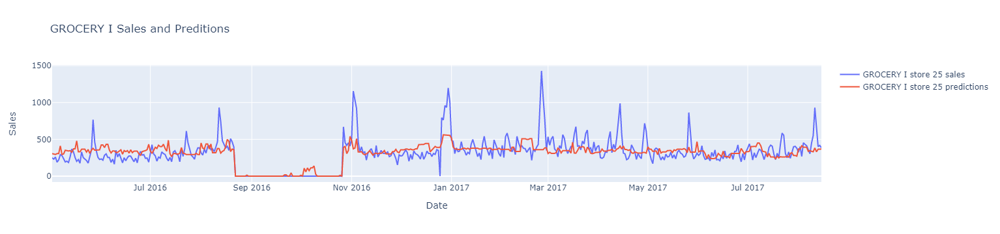

In [41]:
import plotly.graph_objects as go
fig=go.Figure()
fig.add_trace(go.Scatter(x=grocery_df_25['date'],y=grocery_df_25['sales'],mode='lines',name='GROCERY I store 25 sales'))
fig.add_trace(go.Scatter(x=grocery_df_25['date'],y=grocery_df_25['pred'].clip(0),mode='lines',name='GROCERY I store 25 predictions'))

fig.update_xaxes(title='Date')
fig.update_yaxes(title='Sales')
fig.update_layout(title='GROCERY I Sales and Preditions')
fig.show()

In [42]:
submission=pd.read_csv('./sample_submission.csv')

In [43]:
x=test.copy(deep=True)

In [44]:
x['pred']=np.nan

In [45]:
for i in test_xg_dict.keys():
    x.loc[x['family']==i,'pred']=test_xg_dict[i]['pred'].clip(0)

In [46]:
submission['sales']=x['pred'].values

In [47]:
submission.to_csv('submission_pooling_family_xgb.csv',index=False)

In [48]:
submission

,id,sales
0,3000888,5.008786e+00
1,3000889,0.000000e+00
2,3000890,6.002928e+00
3,3000891,2.600405e+03
4,3000892,1.618293e-16
...,...,...
28507,3029395,5.601229e+02
28508,3029396,8.641938e+01
28509,3029397,1.742267e+03
28510,3029398,1.464020e+02


# Forecast Assessment 

## Metric : RMSE

In [49]:
lgbm_rmse_df=pd.DataFrame.from_dict(lgbm_rmse_dict,orient='index')

In [50]:
lr_rmse_df=pd.DataFrame.from_dict(lr_rmse_dict,orient='index')

In [51]:
xg_rmse_df=pd.DataFrame.from_dict(xg_rmse_dict,orient='index')

In [52]:
rmse_df=pd.DataFrame(columns=['LGBM','LR','XGBOOST','LGBM-LR','LGBM-XGBOOST','XGBOOST-LR'])

In [53]:
rmse_df['LGBM']=lgbm_rmse_df
rmse_df['LR']=lr_rmse_df
rmse_df['XGBOOST']=xg_rmse_df
rmse_df['LGBM-LR']=lgbm_rmse_df-lr_rmse_df
rmse_df['LGBM-XGBOOST']=lgbm_rmse_df-xg_rmse_df
rmse_df['XGBOOST-LR']=xg_rmse_df-lr_rmse_df

In [54]:
rmse_df

,LGBM,LR,XGBOOST,LGBM-LR,LGBM-XGBOOST,XGBOOST-LR
AUTOMOTIVE,5.053851,6.407461e+00,5.207405,-1.353610e+00,-0.153553,-1.200057e+00
BABY CARE,0.787181,7.782652e-01,1.900424,8.915539e-03,-1.113243,1.122159e+00
BEAUTY,4.705055,5.211883e+00,4.513214,-5.068280e-01,0.191840,-6.986682e-01
BEVERAGES,1599.632100,3.143679e+03,1647.228977,-1.544047e+03,-47.596876,-1.496450e+03
BOOKS,1.045874,1.045874e+00,1.045874,0.000000e+00,0.000000,0.000000e+00
BREAD/BAKERY,200.339697,2.130079e+02,200.507438,-1.266823e+01,-0.167741,-1.250049e+01
CELEBRATION,15.121055,1.542649e+02,15.429975,-1.391439e+02,-0.308920,-1.388350e+02
CLEANING,495.823919,4.871235e+02,515.755743,8.700416e+00,-19.931824,2.863224e+01
DAIRY,343.937590,3.746382e+02,344.297346,-3.070062e+01,-0.359756,-3.034087e+01
DELI,118.775403,1.280998e+02,121.384335,-9.324379e+00,-2.608932,-6.715447e+00


In [55]:
lr_lgbm_improvers= rmse_df[rmse_df['LGBM-LR']>0]
lr_lgbm_offenders= rmse_df[rmse_df['LGBM-LR']<0]
xgb_lgbm_improvers= rmse_df[rmse_df['LGBM-XGBOOST']>0]
xgb_lgbm_offenders= rmse_df[rmse_df['LGBM-XGBOOST']<0]
lr_xgb_improvers= rmse_df[rmse_df['XGBOOST-LR']>0]
lr_xgb_offenders= rmse_df[rmse_df['XGBOOST-LR']<0]

# LR Better Than LGBM

In [56]:
lr_lgbm_improvers.sort_values('LGBM-LR',ascending=False)

,LGBM,LR,XGBOOST,LGBM-LR,LGBM-XGBOOST,XGBOOST-LR
CLEANING,495.823919,487.123503,515.755743,8.700416,-19.931824,28.632240
PERSONAL CARE,161.897573,161.040348,184.097188,0.857225,-22.199615,23.056840
LINGERIE,10.353026,10.279434,11.048999,0.073592,-0.695974,0.769566
BABY CARE,0.787181,0.778265,1.900424,0.008916,-1.113243,1.122159
HOME APPLIANCES,0.836497,0.836035,0.843521,0.000462,-0.007024,0.007486


## CLEANING: LR Better Than LGBM Store 1 Example

In [57]:
cleaning_lr=lr_df['CLEANING']
cleaning_lgbm=lgbm_df['CLEANING']

In [58]:
cleaning_lr_1=cleaning_lr[cleaning_lr['store_nbr']==1]
cleaning_lgbm_1=cleaning_lgbm[cleaning_lgbm['store_nbr']==1]

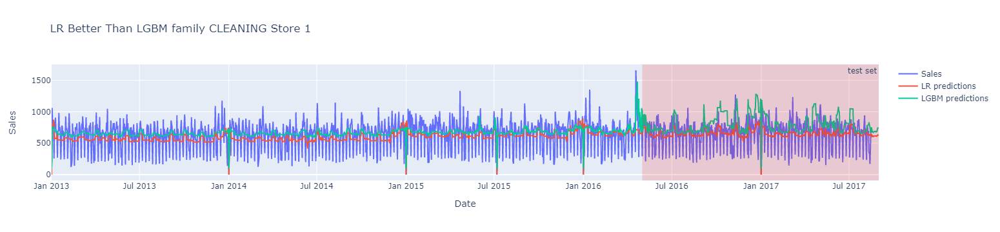

In [59]:
import plotly.graph_objects as go
fig=go.Figure()
fig.add_trace(go.Scatter(x=cleaning_lr_1.date,y=cleaning_lr_1.sales,mode='lines',name='Sales'))
fig.add_trace(go.Scatter(x=cleaning_lr_1.date,y=cleaning_lr_1.pred.clip(0),mode='lines',name='LR predictions'))
fig.add_trace(go.Scatter(x=cleaning_lgbm_1.date,y=cleaning_lgbm_1.pred.clip(0),mode='lines',name='LGBM predictions'))
fig.add_vrect(x0='2016-05-01', x1='2017-08-31',line_width=0, fillcolor="red", opacity=0.15,annotation_text ='test set')

fig.update_layout(title = "LR Better Than LGBM family CLEANING Store 1")
fig.update_xaxes(title_text="Date")
fig.update_yaxes(title_text="Sales")
fig.show()

## PERSONAL CARE: LR Better Than LGBM Store 35 Example

In [60]:
personal_lr=lr_df['PERSONAL CARE']
personal_lgbm=lgbm_df['PERSONAL CARE']

In [61]:
personal_lr_1=personal_lr[personal_lr['store_nbr']==35]
personal_lgbm_1=personal_lgbm[personal_lgbm['store_nbr']==35]

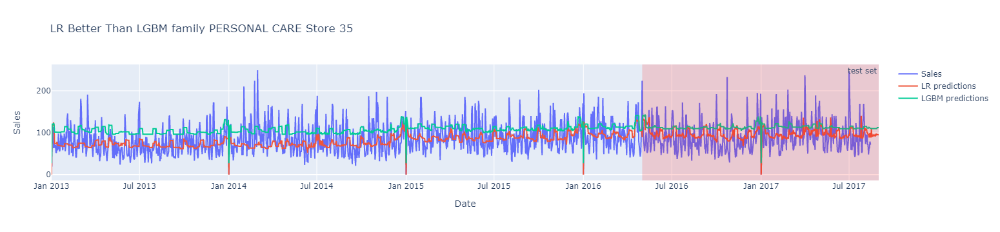

In [62]:
import plotly.graph_objects as go
fig=go.Figure()
fig.add_trace(go.Scatter(x=personal_lr_1.date,y=personal_lr_1.sales,mode='lines',name='Sales'))
fig.add_trace(go.Scatter(x=personal_lr_1.date,y=personal_lr_1.pred.clip(0),mode='lines',name='LR predictions'))
fig.add_trace(go.Scatter(x=personal_lgbm_1.date,y=personal_lgbm_1.pred.clip(0),mode='lines',name='LGBM predictions'))
fig.add_vrect(x0='2016-05-01', x1='2017-08-31',line_width=0, fillcolor="red", opacity=0.15,annotation_text ='test set')
fig.update_layout(title = "LR Better Than LGBM family PERSONAL CARE Store 35")
fig.update_xaxes(title_text="Date")
fig.update_yaxes(title_text="Sales")
fig.show()

# LGBM Better Than LR 

In [63]:
lr_lgbm_offenders.sort_values('LGBM-LR')

,LGBM,LR,XGBOOST,LGBM-LR,LGBM-XGBOOST,XGBOOST-LR
HOME CARE,144.644986,3.614790e+15,150.638979,-3.614790e+15,-5.993994,-3.614790e+15
PLAYERS AND ELECTRONICS,11.470751,6.001102e+04,11.244396,-5.999955e+04,0.226355,-5.999978e+04
HOME AND KITCHEN II,28.286980,6.795983e+03,33.372232,-6.767696e+03,-5.085252,-6.762611e+03
PRODUCE,1474.318310,7.465872e+03,1636.246503,-5.991554e+03,-161.928193,-5.829626e+03
HOME AND KITCHEN I,35.389882,4.113895e+03,38.554665,-4.078505e+03,-3.164783,-4.075340e+03
"LIQUOR,WINE,BEER",97.518967,1.679831e+03,103.811142,-1.582312e+03,-6.292175,-1.576020e+03
BEVERAGES,1599.632100,3.143679e+03,1647.228977,-1.544047e+03,-47.596876,-1.496450e+03
SCHOOL AND OFFICE SUPPLIES,28.742311,7.869778e+02,30.639125,-7.582355e+02,-1.896814,-7.563387e+02
CELEBRATION,15.121055,1.542649e+02,15.429975,-1.391439e+02,-0.308920,-1.388350e+02
DAIRY,343.937590,3.746382e+02,344.297346,-3.070062e+01,-0.359756,-3.034087e+01


## HOME CARE : LGBM Better Than LR  Store 44 Example 

In [64]:
homecare_lr=lr_df['HOME CARE']
homecare_lgbm=lgbm_df['HOME CARE']

In [65]:
homecare_lr_1=homecare_lr[homecare_lr['store_nbr']==44]
homecare_lgbm_1=homecare_lgbm[homecare_lgbm['store_nbr']==44]

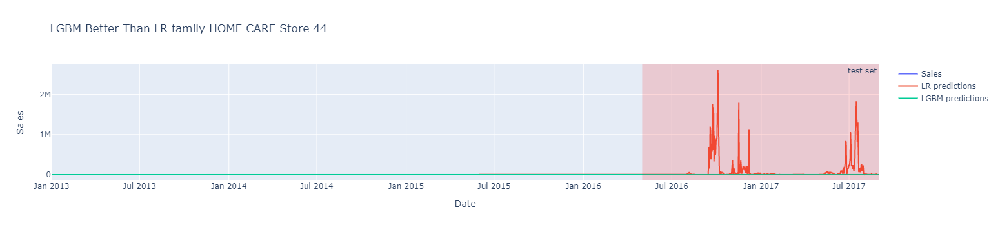

In [67]:
import plotly.graph_objects as go
fig=go.Figure()
fig.add_trace(go.Scatter(x=homecare_lr_1.date,y=homecare_lr_1.sales,mode='lines',name='Sales'))
fig.add_trace(go.Scatter(x=homecare_lr_1.date,y=homecare_lr_1.pred,mode='lines',name='LR predictions'))
fig.add_trace(go.Scatter(x=homecare_lgbm_1.date,y=homecare_lgbm_1.pred.clip(0),mode='lines',name='LGBM predictions'))
fig.add_vrect(x0='2016-05-01', x1='2017-08-31',line_width=0, fillcolor="red", opacity=0.15,annotation_text ='test set')

fig.update_layout(title = "LGBM Better Than LR family HOME CARE Store 44")
fig.update_xaxes(title_text="Date")
fig.update_yaxes(title_text="Sales")
fig.show()

## PLAYERS AND ELECTRONICS : LGBM Better Than LR  Store 44 Example 

In [68]:
players_lr=lr_df['PLAYERS AND ELECTRONICS']
players_lgbm=lgbm_df['PLAYERS AND ELECTRONICS']

In [69]:
players_lr_1=players_lr[players_lr['store_nbr']==44]
players_lgbm_1=players_lgbm[players_lgbm['store_nbr']==44]

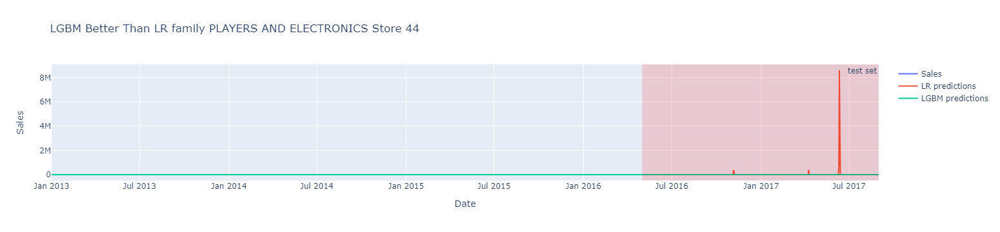

In [70]:
import plotly.graph_objects as go
fig=go.Figure()
fig.add_trace(go.Scatter(x=players_lr_1.date,y=players_lr_1.sales,mode='lines',name='Sales'))
fig.add_trace(go.Scatter(x=players_lr_1.date,y=players_lr_1.pred,mode='lines',name='LR predictions'))
fig.add_trace(go.Scatter(x=players_lgbm_1.date,y=players_lgbm_1.pred.clip(0),mode='lines',name='LGBM predictions'))
fig.add_vrect(x0='2016-05-01', x1='2017-08-31',line_width=0, fillcolor="red", opacity=0.15,annotation_text ='test set')

fig.update_layout(title = "LGBM Better Than LR family PLAYERS AND ELECTRONICS Store 44")
fig.update_xaxes(title_text="Date")
fig.update_yaxes(title_text="Sales")
fig.show()

#  XGBOOST Better Than LGBM

In [71]:
xgb_lgbm_improvers.sort_values('LGBM-XGBOOST',ascending=False)

,LGBM,LR,XGBOOST,LGBM-LR,LGBM-XGBOOST,XGBOOST-LR
FROZEN FOODS,216.244741,228.631490,210.258084,-12.386749,5.986656,-18.373405
LADIESWEAR,14.435550,16.142762,13.484858,-1.707212,0.950692,-2.657904
PET SUPPLIES,9.501262,15.058349,8.749867,-5.557087,0.751395,-6.308481
POULTRY,212.778918,222.786933,212.225262,-10.008015,0.553656,-10.561671
PLAYERS AND ELECTRONICS,11.470751,60011.020502,11.244396,-59999.549751,0.226355,-59999.776106
BEAUTY,4.705055,5.211883,4.513214,-0.506828,0.191840,-0.698668
EGGS,117.267929,132.381039,117.157171,-15.113110,0.110758,-15.223868
LAWN AND GARDEN,18.489726,35.788608,18.480375,-17.298883,0.009351,-17.308233


## FROZEN FOODS : XGBOOST Better Than LGBM Store 44 Example 

In [72]:
frozen_xgb=xg_df['FROZEN FOODS']
frozen_lgbm=lgbm_df['FROZEN FOODS']

In [73]:
frozen_xgb_1=frozen_xgb[frozen_xgb['store_nbr']==44]
frozen_lgbm_1=frozen_lgbm[frozen_lgbm['store_nbr']==44]

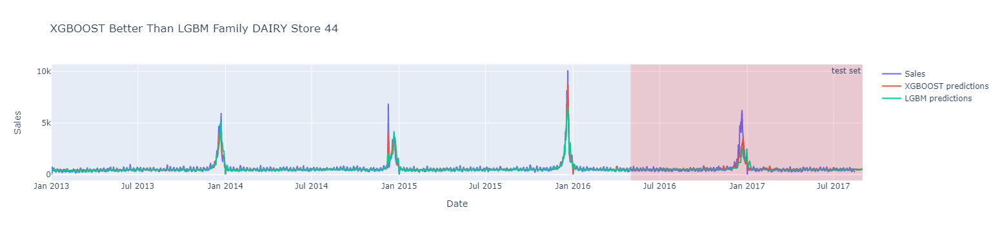

In [74]:
import plotly.graph_objects as go
fig=go.Figure()
fig.add_trace(go.Scatter(x=frozen_xgb_1.date,y=frozen_xgb_1.sales,mode='lines',name='Sales'))
fig.add_trace(go.Scatter(x=frozen_xgb_1.date,y=frozen_xgb_1.pred,mode='lines',name='XGBOOST predictions'))
fig.add_trace(go.Scatter(x=frozen_lgbm_1.date,y=frozen_lgbm_1.pred.clip(0),mode='lines',name='LGBM predictions'))
fig.add_vrect(x0='2016-05-01', x1='2017-08-31',line_width=0, fillcolor="red", opacity=0.15,annotation_text ='test set')

fig.update_layout(title = "XGBOOST Better Than LGBM Family DAIRY Store 44")
fig.update_xaxes(title_text="Date")
fig.update_yaxes(title_text="Sales")
fig.show()

## LADIESWEAR : XGBOOST Better Than LGBM Store 44 Example

In [75]:
ladieswear_xgb=xg_df['LADIESWEAR']
ladieswear_lgbm=lgbm_df['LADIESWEAR']

In [76]:
ladieswear_xgb_1=ladieswear_xgb[ladieswear_xgb['store_nbr']==44]
ladieswear_lgbm_1=ladieswear_lgbm[ladieswear_lgbm['store_nbr']==44]

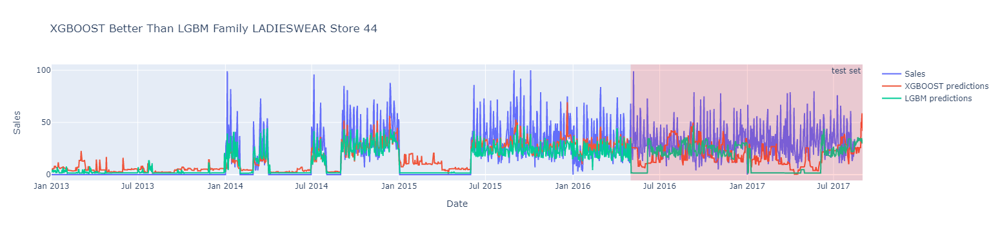

In [77]:
import plotly.graph_objects as go
fig=go.Figure()
fig.add_trace(go.Scatter(x=ladieswear_xgb_1.date,y=ladieswear_xgb_1.sales,mode='lines',name='Sales'))
fig.add_trace(go.Scatter(x=ladieswear_xgb_1.date,y=ladieswear_xgb_1.pred,mode='lines',name='XGBOOST predictions'))
fig.add_trace(go.Scatter(x=ladieswear_lgbm_1.date,y=ladieswear_lgbm_1.pred.clip(0),mode='lines',name='LGBM predictions'))
fig.add_vrect(x0='2016-05-01', x1='2017-08-31',line_width=0, fillcolor="red", opacity=0.15,annotation_text ='test set')

fig.update_layout(title = "XGBOOST Better Than LGBM Family LADIESWEAR Store 44")
fig.update_xaxes(title_text="Date")
fig.update_yaxes(title_text="Sales")
fig.show()

# LGBM Better Than XGBOOST

In [78]:
xgb_lgbm_offenders.sort_values('LGBM-XGBOOST')

,LGBM,LR,XGBOOST,LGBM-LR,LGBM-XGBOOST,XGBOOST-LR
PRODUCE,1474.318310,7.465872e+03,1636.246503,-5.991554e+03,-161.928193,-5.829626e+03
GROCERY I,1886.925186,1.902979e+03,2048.578391,-1.605401e+01,-161.653205,1.455992e+02
BEVERAGES,1599.632100,3.143679e+03,1647.228977,-1.544047e+03,-47.596876,-1.496450e+03
PERSONAL CARE,161.897573,1.610403e+02,184.097188,8.572251e-01,-22.199615,2.305684e+01
CLEANING,495.823919,4.871235e+02,515.755743,8.700416e+00,-19.931824,2.863224e+01
"LIQUOR,WINE,BEER",97.518967,1.679831e+03,103.811142,-1.582312e+03,-6.292175,-1.576020e+03
HOME CARE,144.644986,3.614790e+15,150.638979,-3.614790e+15,-5.993994,-3.614790e+15
HOME AND KITCHEN II,28.286980,6.795983e+03,33.372232,-6.767696e+03,-5.085252,-6.762611e+03
HOME AND KITCHEN I,35.389882,4.113895e+03,38.554665,-4.078505e+03,-3.164783,-4.075340e+03
DELI,118.775403,1.280998e+02,121.384335,-9.324379e+00,-2.608932,-6.715447e+00


## PRODUCE : LGBM Better Than XGBOOST Store 1 Example 

In [79]:
produce_xgb=xg_df['PRODUCE']
produce_lgbm=lgbm_df['PRODUCE']

In [80]:
produce_xgb_1=produce_xgb[produce_xgb['store_nbr']==1]
produce_lgbm_1=produce_lgbm[produce_lgbm['store_nbr']==1]

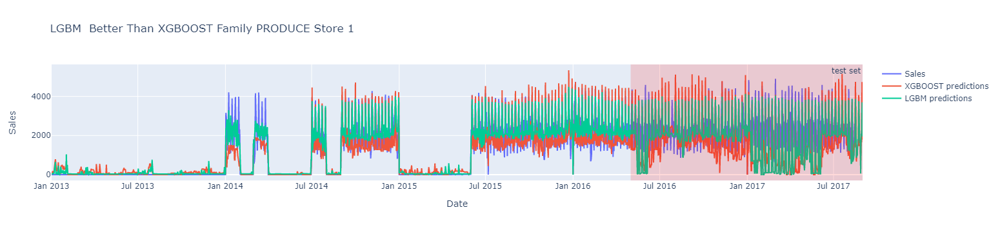

In [81]:
import plotly.graph_objects as go
fig=go.Figure()
fig.add_trace(go.Scatter(x=produce_xgb_1.date,y=produce_xgb_1.sales,mode='lines',name='Sales'))
fig.add_trace(go.Scatter(x=produce_xgb_1.date,y=produce_xgb_1.pred.clip(0),mode='lines',name='XGBOOST predictions'))
fig.add_trace(go.Scatter(x=produce_lgbm_1.date,y=produce_lgbm_1.pred.clip(0),mode='lines',name='LGBM predictions'))
fig.add_vrect(x0='2016-05-01', x1='2017-08-31',line_width=0, fillcolor="red", opacity=0.15,annotation_text ='test set')

fig.update_layout(title = "LGBM  Better Than XGBOOST Family PRODUCE Store 1")
fig.update_xaxes(title_text="Date")
fig.update_yaxes(title_text="Sales")
fig.show()

## GROCERY I : LGBM Better Than XGBOOST Store 45 Example 

In [82]:
grocery1_xgb=xg_df['GROCERY I']
grocery1_lgbm=lgbm_df['GROCERY I']

In [83]:
grocery1_xgb_1=grocery1_xgb[grocery1_xgb['store_nbr']==45]
grocery1_lgbm_1=grocery1_lgbm[grocery1_lgbm['store_nbr']==45]

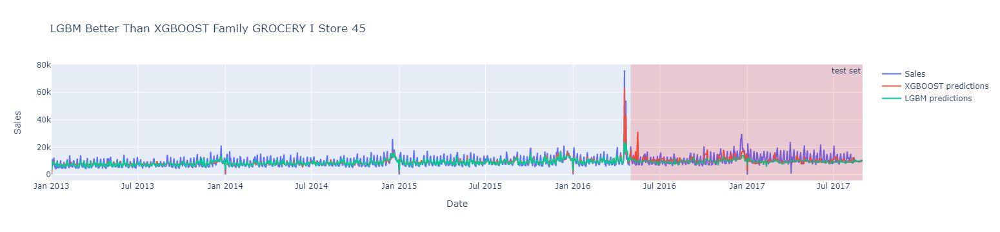

In [84]:
import plotly.graph_objects as go
fig=go.Figure()
fig.add_trace(go.Scatter(x=grocery1_xgb_1.date,y=grocery1_xgb_1.sales,mode='lines',name='Sales'))
fig.add_trace(go.Scatter(x=grocery1_xgb_1.date,y=grocery1_xgb_1.pred.clip(0),mode='lines',name='XGBOOST predictions'))
fig.add_trace(go.Scatter(x=grocery1_lgbm_1.date,y=grocery1_lgbm_1.pred.clip(0),mode='lines',name='LGBM predictions'))
fig.add_vrect(x0='2016-05-01', x1='2017-08-31',line_width=0, fillcolor="red", opacity=0.15,annotation_text ='test set')

fig.update_layout(title = "LGBM Better Than XGBOOST Family GROCERY I Store 45")
fig.update_xaxes(title_text="Date")
fig.update_yaxes(title_text="Sales")
fig.show()

# LR Better Than XGBOOST 

In [85]:
lr_xgb_improvers.sort_values('XGBOOST-LR',ascending=False)

,LGBM,LR,XGBOOST,LGBM-LR,LGBM-XGBOOST,XGBOOST-LR
GROCERY I,1886.925186,1902.979200,2048.578391,-16.054014,-161.653205,145.599192
CLEANING,495.823919,487.123503,515.755743,8.700416,-19.931824,28.632240
PERSONAL CARE,161.897573,161.040348,184.097188,0.857225,-22.199615,23.056840
BABY CARE,0.787181,0.778265,1.900424,0.008916,-1.113243,1.122159
LINGERIE,10.353026,10.279434,11.048999,0.073592,-0.695974,0.769566
HOME APPLIANCES,0.836497,0.836035,0.843521,0.000462,-0.007024,0.007486


## GROCERY I LR Better Than XGBOOST Store 44 Example 

In [86]:
grocery1_xgb=xg_df['GROCERY I']
grocery1_lr=lr_df['GROCERY I']

In [87]:
grocery1_xgb_1=grocery1_xgb[grocery1_xgb['store_nbr']==44]
grocery1_lr_1=grocery1_lr[grocery1_lr['store_nbr']==44]

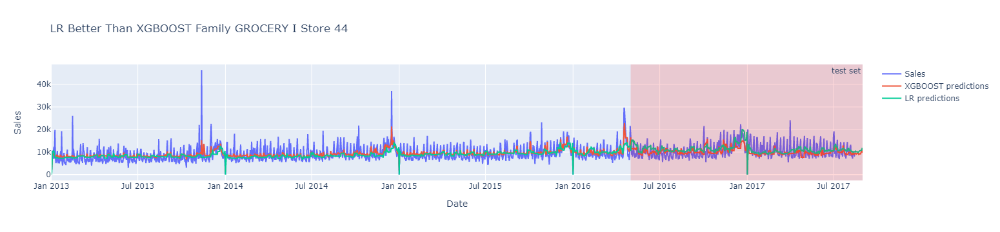

In [88]:
import plotly.graph_objects as go
fig=go.Figure()
fig.add_trace(go.Scatter(x=grocery1_xgb_1.date,y=grocery1_xgb_1.sales,mode='lines',name='Sales'))
fig.add_trace(go.Scatter(x=grocery1_xgb_1.date,y=grocery1_xgb_1.pred.clip(0),mode='lines',name='XGBOOST predictions'))
fig.add_trace(go.Scatter(x=grocery1_lr_1.date,y=grocery1_lr_1.pred.clip(0),mode='lines',name='LR predictions'))
fig.add_vrect(x0='2016-05-01', x1='2017-08-31',line_width=0, fillcolor="red", opacity=0.15,annotation_text ='test set')

fig.update_layout(title = "LR Better Than XGBOOST Family GROCERY I Store 44")
fig.update_xaxes(title_text="Date")
fig.update_yaxes(title_text="Sales")
fig.show()

## CLEANING : LR Better Than XGBOOST Store 1 Example 

In [89]:
cleaning_xgb=xg_df['CLEANING']
cleaning_lr=lr_df['CLEANING']

In [90]:
cleaning_xgb_1=cleaning_xgb[cleaning_xgb['store_nbr']==1]
cleaning_lr_1=cleaning_lr[cleaning_lr['store_nbr']==1]

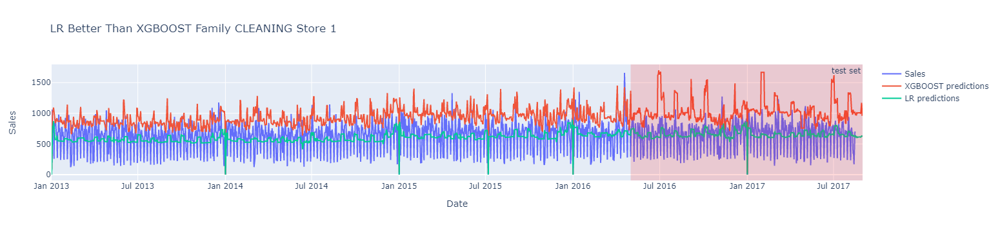

In [91]:
import plotly.graph_objects as go
fig=go.Figure()
fig.add_trace(go.Scatter(x=cleaning_xgb_1.date,y=cleaning_xgb_1.sales,mode='lines',name='Sales'))
fig.add_trace(go.Scatter(x=cleaning_xgb_1.date,y=cleaning_xgb_1.pred.clip(0),mode='lines',name='XGBOOST predictions'))
fig.add_trace(go.Scatter(x=cleaning_lr_1.date,y=cleaning_lr_1.pred.clip(0),mode='lines',name='LR predictions'))
fig.add_vrect(x0='2016-05-01', x1='2017-08-31',line_width=0, fillcolor="red", opacity=0.15,annotation_text ='test set')

fig.update_layout(title = "LR Better Than XGBOOST Family CLEANING Store 1")
fig.update_xaxes(title_text="Date")
fig.update_yaxes(title_text="Sales")
fig.show()

# XGBOOST Better Than LR 

In [92]:
lr_xgb_offenders.sort_values('XGBOOST-LR')

,LGBM,LR,XGBOOST,LGBM-LR,LGBM-XGBOOST,XGBOOST-LR
HOME CARE,144.644986,3.614790e+15,150.638979,-3.614790e+15,-5.993994,-3.614790e+15
PLAYERS AND ELECTRONICS,11.470751,6.001102e+04,11.244396,-5.999955e+04,0.226355,-5.999978e+04
HOME AND KITCHEN II,28.286980,6.795983e+03,33.372232,-6.767696e+03,-5.085252,-6.762611e+03
PRODUCE,1474.318310,7.465872e+03,1636.246503,-5.991554e+03,-161.928193,-5.829626e+03
HOME AND KITCHEN I,35.389882,4.113895e+03,38.554665,-4.078505e+03,-3.164783,-4.075340e+03
"LIQUOR,WINE,BEER",97.518967,1.679831e+03,103.811142,-1.582312e+03,-6.292175,-1.576020e+03
BEVERAGES,1599.632100,3.143679e+03,1647.228977,-1.544047e+03,-47.596876,-1.496450e+03
SCHOOL AND OFFICE SUPPLIES,28.742311,7.869778e+02,30.639125,-7.582355e+02,-1.896814,-7.563387e+02
CELEBRATION,15.121055,1.542649e+02,15.429975,-1.391439e+02,-0.308920,-1.388350e+02
DAIRY,343.937590,3.746382e+02,344.297346,-3.070062e+01,-0.359756,-3.034087e+01


## HOME CARE : XGBOOST Better Than LR  Store 25 Example 

In [93]:
homecare_xgb=xg_df['HOME CARE']
homecare_lr=lr_df['HOME CARE']

In [94]:
homecare_xgb_1=homecare_xgb[homecare_xgb['store_nbr']==25]
homecare_lr_1=homecare_lr[homecare_lr['store_nbr']==25]

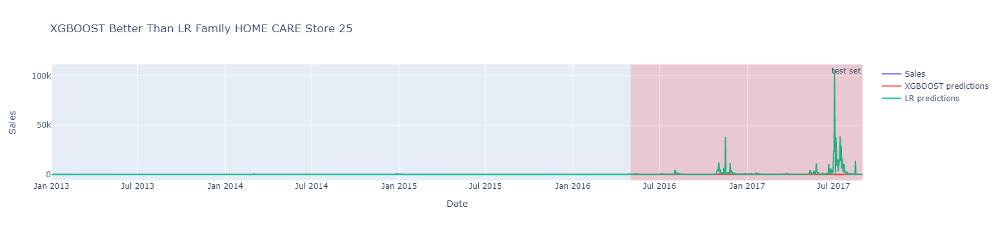

In [95]:
import plotly.graph_objects as go
fig=go.Figure()
fig.add_trace(go.Scatter(x=homecare_xgb_1.date,y=homecare_xgb_1.sales,mode='lines',name='Sales'))
fig.add_trace(go.Scatter(x=homecare_xgb_1.date,y=homecare_xgb_1.pred,mode='lines',name='XGBOOST predictions'))
fig.add_trace(go.Scatter(x=homecare_lr_1.date,y=homecare_lr_1.pred.clip(0),mode='lines',name='LR predictions'))
fig.add_vrect(x0='2016-05-01', x1='2017-08-31',line_width=0, fillcolor="red", opacity=0.15,annotation_text ='test set')

fig.update_layout(title = "XGBOOST Better Than LR Family HOME CARE Store 25")
fig.update_xaxes(title_text="Date")
fig.update_yaxes(title_text="Sales")
fig.show()

## PLAYERS AND ELECTRONICS : XGBOOST Better Than LR Store 44 Example 

In [96]:
players_xgb=xg_df['PLAYERS AND ELECTRONICS']
players_lr=lr_df['PLAYERS AND ELECTRONICS']

In [97]:
players_xgb_1=players_xgb[players_xgb['store_nbr']==44]
players_lr_1=players_lr[players_lr['store_nbr']==44]

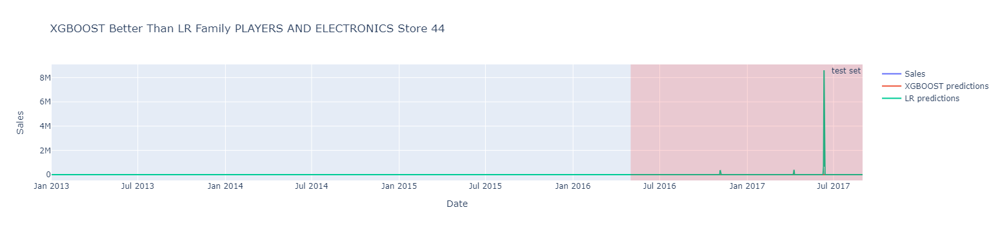

In [98]:
import plotly.graph_objects as go
fig=go.Figure()
fig.add_trace(go.Scatter(x=players_xgb_1.date,y=players_xgb_1.sales,mode='lines',name='Sales'))
fig.add_trace(go.Scatter(x=players_xgb_1.date,y=players_xgb_1.pred,mode='lines',name='XGBOOST predictions'))
fig.add_trace(go.Scatter(x=players_lr_1.date,y=players_lr_1.pred.clip(0),mode='lines',name='LR predictions'))
fig.add_vrect(x0='2016-05-01', x1='2017-08-31',line_width=0, fillcolor="red", opacity=0.15,annotation_text ='test set')

fig.update_layout(title = "XGBOOST Better Than LR Family PLAYERS AND ELECTRONICS Store 44")
fig.update_xaxes(title_text="Date")
fig.update_yaxes(title_text="Sales")
fig.show()